# IGRINS Data Analysis Template

This notebook should be able to handle any IGRINS txt spectrum. Each notebook will:

- Mark each photospheric feature
- Fit a local continuum
- Fit a (multi-component) Gaussian
- Calculate Equivalent Widths for each feature

In [2]:
from muler.igrins import IGRINSSpectrum
from muler.hpf import HPFSpectrum

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import glob
import os
# from astropy.io import ascii
# from astropy.io import fits
# from astropy.table import Table, Column, join
# from astropy.wcs import WCS
# from astropy.modeling import models, fitting

# from specutils import Spectrum1D
# from specutils import SpectralRegion
# from specutils.fitting import fit_generic_continuum, fit_continuum, fit_lines, find_lines_threshold
# from specutils.analysis import equivalent_width
# from specutils.manipulation import noise_region_uncertainty

from scipy.integrate import trapz
from scipy.optimize import curve_fit
from scipy.signal import savgol_filter
from scipy.ndimage import median_filter

%matplotlib inline
%config InlineBackend.figure_format='retina'
%config Completer.use_jedi = False

In [3]:
# Plotting Parameters
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 18
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] =18
plt.rcParams['legend.fontsize'] = 16
plt.rcParams['figure.titlesize'] = 20
plt.rcParams['axes.labelweight']='bold'
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.major.size'] = 7
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['xtick.minor.size'] = 5
plt.rcParams['ytick.major.size'] = 7
plt.rcParams['xtick.minor.visible'] = True
plt.rcParams['ytick.minor.size'] = 5
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.direction'] = 'in'

In [4]:
# Reduced data in txt files
data_path = "A:/Documents/Grad_School/Research/IGRINS_Merged/"
# File path for figures to live in
fig_path = "A:/Documents/Grad_School/IGRINS-Spectra/IGRINS_figs/standards_spectra/"

# Create the folder if it doesn't exist
if not os.path.exists(fig_path):
    os.makedirs(fig_path)

# Nicole's merged K-band spectra of some Taurus Standards
merged_standard_files = glob.glob(data_path+"merged_standards/m*.txt")

# NIR Lines in micron
# Line catalog incomplete, who to contact
# Kyle Kaplan, stellar people with IGRINS
# Ask Cushing (Sam, Bobby)
# Look up some literature (Dotmann)
nir_dict = {
    "Fe-2.084"  :   2.084,
    "Si-2.092"	:   2.092,
    "Mg-2.106"	:	2.106,
    "Al-2.11"	:	2.11,
    "Ca-2.2035"	:	2.2035,
    "Fe-2.2037"	:	2.2037,
    "Sc-2.2052"	:	2.2052,
    "Na-2.2052"	:	2.2052,
    "Si-2.2063"	:	2.2063,
    "Sc-2.2065"	:	2.2065,
    "Si-2.2073"	:	2.2073,
    "Fe-2.2079"	:	2.2079,
    "Na-2.2083"	:	2.2083,
    "Ca-2.2113"	:	2.2113,
    "Br-Gamma"  :   2.1655,
    "Ti-2.2218"	:	2.2218,
    "Ti-2.224"	:	2.224,
    "Fe-2.226"	:	2.226,
    "Ti-2.228"	:	2.228,
    "Ti-2.232"	:	2.232,
    "Ca-2.26573":	2.26573,
    "Fe-2.2742"	:	2.2742,
    "Mg-2.281"	:	2.281,
    "Ca-2.2825"	:	2.2825,
    "Fe-2.284"	:	2.284,
    "Ti-2.29"	:	2.29,
    "Ti-2.297"	:	2.297,
    "CO(2-0)-2.29353" :	2.29353,
    "CO(2-0)-2.32265"	:	2.32265,
    "CO(2-0)-2.34327" :	2.34327,
    "CO(2-0)-2.34531" :	2.34531,
    "CO(2-0)-2.3495" 	:	2.3495,
    "CO(2-0)-2.35167"	:	2.35167,
    "CO(2-0)-2.35246" :	2.35246,
    "CO(2-0)-2.38295" :	2.38295,
    }
# The CO Overtones will be an interesting challenge I'm sure
    # "CO(2-0)-2.29353" :	2.29353,
    # "CO(2-0)-2.32265"	:	2.32265,
    # "CO(2-0)-2.34327" :	2.34327,
    # "CO(2-0)-2.34531" :	2.34531,
    # "CO(2-0)-2.3495" 	:	2.3495,
    # "CO(2-0)-2.35167"	:	2.35167,
    # "CO(2-0)-2.35246" :	2.35246,
    # "CO(2-0)-2.38295" :	2.38295,
    # }

# Strings of the Nir lines
lines_str = list(nir_dict.keys())

# Wavelength values for each NIR line
lines_wav = list(nir_dict.values())

# Just a list of the elemental shorthand symbols
labels = [string.split('-')[0] for string in lines_str]

In [5]:
# Pandas Column IDs
# SNR = SNR per resolution element
igrins_cols = ['Wavelength', 'Flux', 'SNR','zero']

# Create Pandas dataframe for the desired standard
standard_df = pd.read_csv(merged_standard_files[0], delimiter='\s+', comment='#', names=igrins_cols)
# SNR column is an object for some reason, change to float
standard_df['SNR'] = standard_df['SNR'].astype(float)

# No negative flux and require 50 < SNR < 10000 and wavlength > 2.0 micron
# & (standard_df['SNR'] < 10000)
# & (standard_df['Flux'].gt(0.4e6))
standard_df = standard_df[(standard_df['Wavelength'].gt(2.)) & (standard_df['SNR'].between(50, 1e4))] 

# Wavelength + Flux Arrays
wavlen = standard_df['Wavelength']
flux = standard_df['Flux']

# med_flux = savgol_filter(flux,5,2)

In [6]:
merged_standard_files

['A:/Documents/Grad_School/Research/IGRINS_Merged/merged_standards\\mAnon1_M05.txt',
 'A:/Documents/Grad_School/Research/IGRINS_Merged/merged_standards\\mHBC427_K6.txt',
 'A:/Documents/Grad_School/Research/IGRINS_Merged/merged_standards\\mHubble4_K8.txt',
 'A:/Documents/Grad_School/Research/IGRINS_Merged/merged_standards\\mJH108_M15.txt',
 'A:/Documents/Grad_School/Research/IGRINS_Merged/merged_standards\\mLkCa14_K5.txt',
 'A:/Documents/Grad_School/Research/IGRINS_Merged/merged_standards\\mLkCa1_M4.txt',
 'A:/Documents/Grad_School/Research/IGRINS_Merged/merged_standards\\mLkCa4_M2.txt',
 'A:/Documents/Grad_School/Research/IGRINS_Merged/merged_standards\\mV410-Xray5a_M6.txt',
 'A:/Documents/Grad_School/Research/IGRINS_Merged/merged_standards\\mV830Tau_K75.txt']

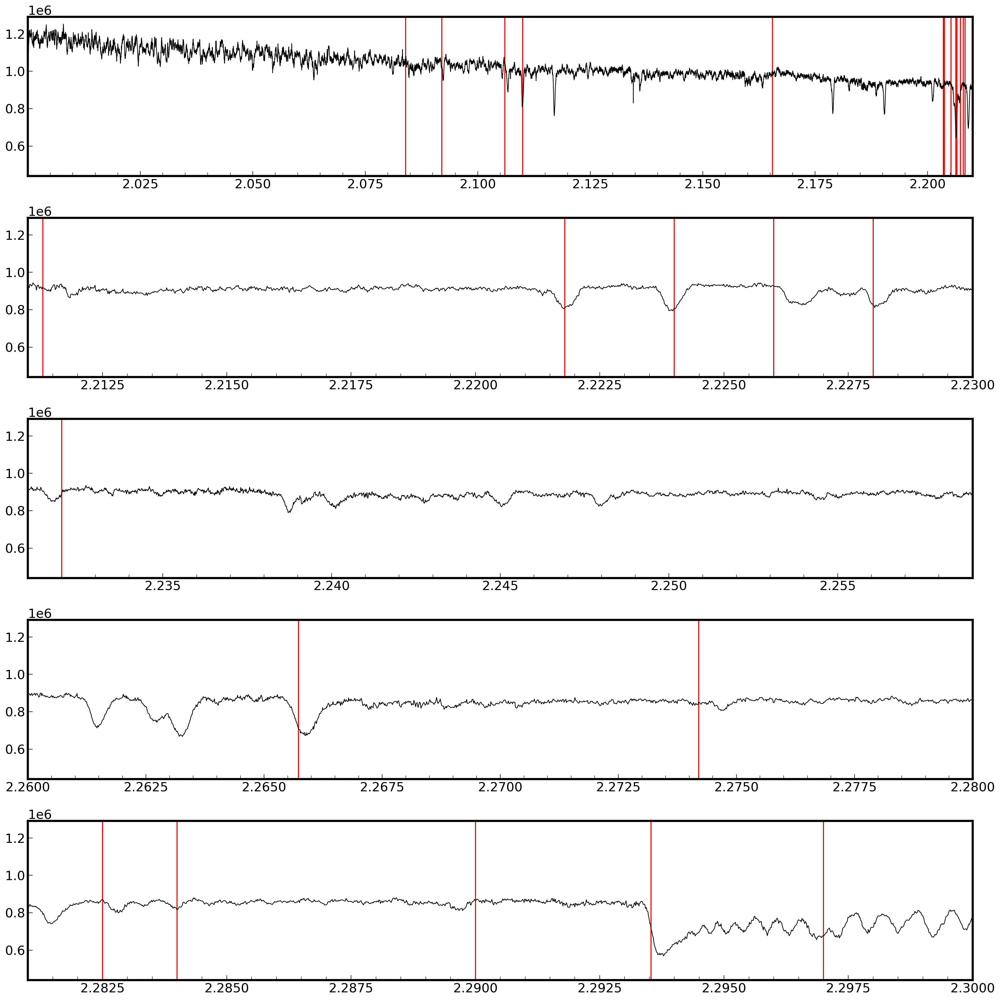

In [7]:
# Comment later because you're a lazy bum
fig,axs = plt.subplots(5,1,figsize=(20,20))

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for value in nir_dict.values():
    # Iterate over the NIR dictionary
    for ax in axs:
        ax.axvline(value,color='red')
        # text_y = ax.get_ylim()[1] * 0.8
        # ax.text(value, text_y, key, ha='right')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

axs[0].plot(wavlen,flux, lw=1, c='k')
axs[0].set_xlim(wavlen.min(),2.21)
# axs[0].set_ylim(0.65,1.1)

axs[1].plot(wavlen,flux, lw=1, c='k')
axs[1].set_xlim(2.211,2.23)

axs[2].plot(wavlen,flux, lw=1, c='k')
axs[2].set_xlim(2.231,2.259)

axs[3].plot(wavlen,flux, lw=1, c='k')
axs[3].set_xlim(2.26,2.28)

axs[4].plot(wavlen,flux, lw=1, c='k')
axs[4].set_xlim(2.281,2.3)
# axs[3].set_ylim(0.75,1.15)

plt.tight_layout()
plt.show()

# Local Continuum Fitting

In [5]:
# Central wavelength (micron)
wave_center = lines_wav[0]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [6]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [7]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

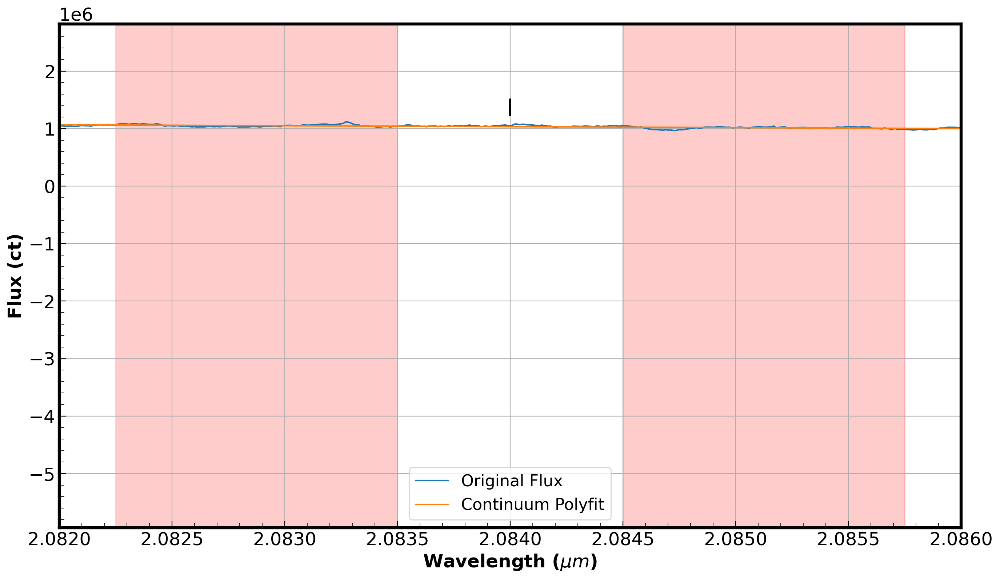

In [8]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.9e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [9]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-4.62303715e-06  2.08367236e+00  1.19735377e-04  1.01712500e+00]


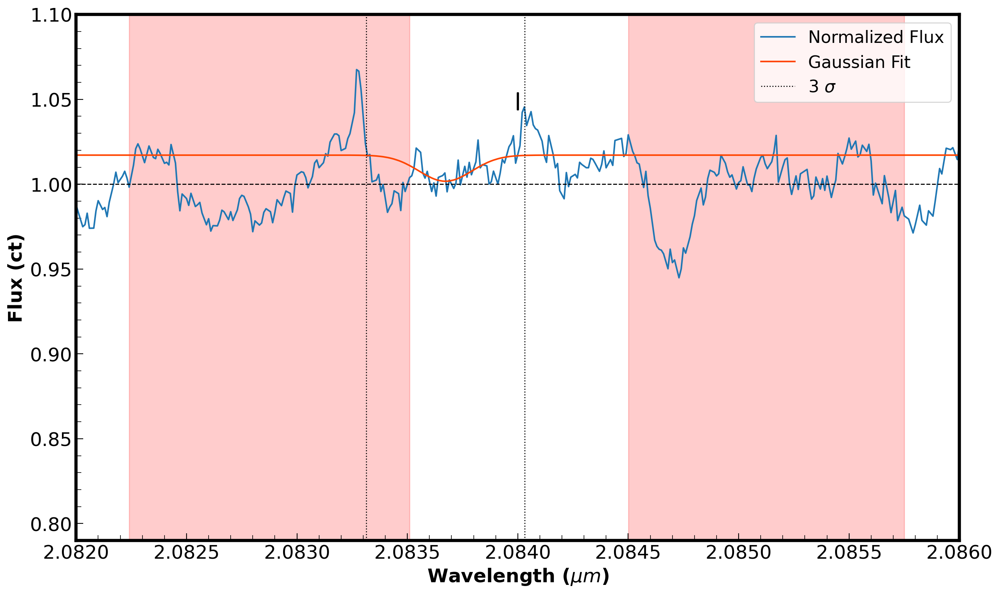

In [10]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [11]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0168353034499387
Relative Absorption: -0.016835303449938666
Half Max Flux: 1.0084176517249692
Half Relative Absorption: -0.008417651724969333


In [12]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-6.656802113364152e-06

In [13]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000013?


In [14]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000013


# Local Continuum Fitting

In [15]:
# Central wavelength (micron)
wave_center = lines_wav[1]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [16]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [17]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

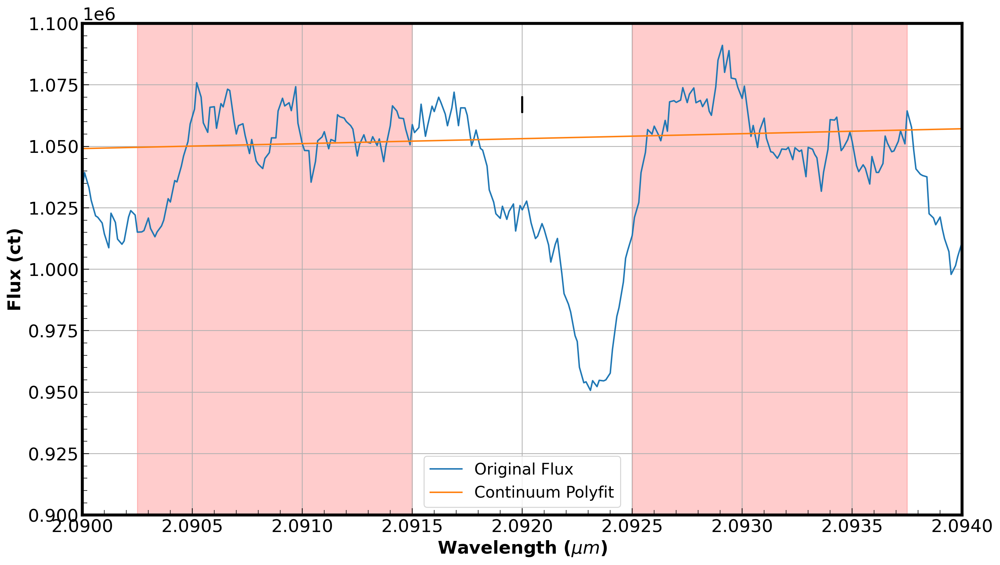

In [22]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.9e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [24]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-3.50370862e-05  2.09230063e+00  1.49919244e-04  1.00059316e+00]


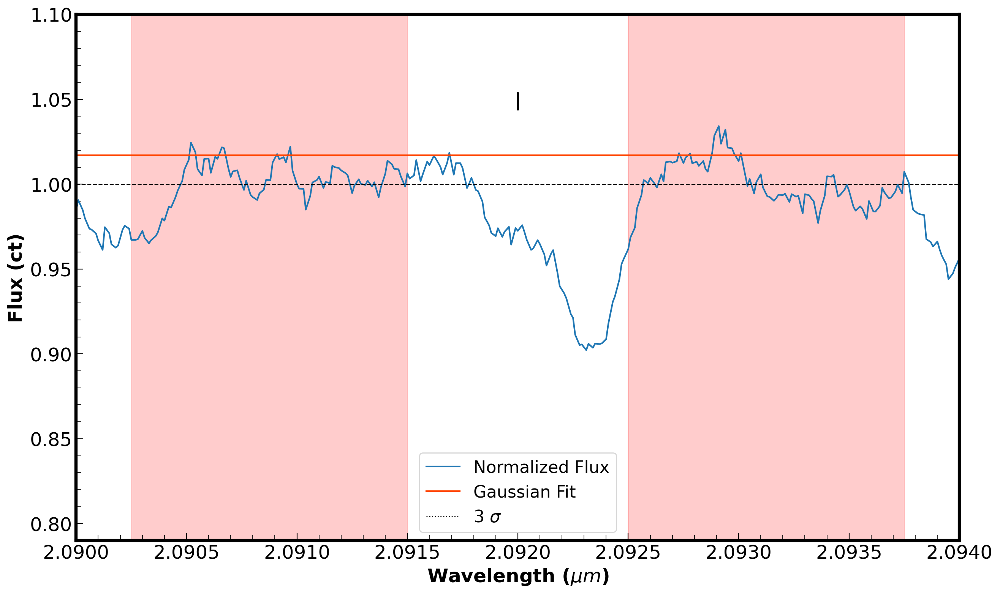

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0171249992526419
Relative Absorption: -0.01712499925264188
Half Max Flux: 1.008562499626321
Half Relative Absorption: -0.00856249962632094


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

8.48858482862771e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000033?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000017


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[2]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

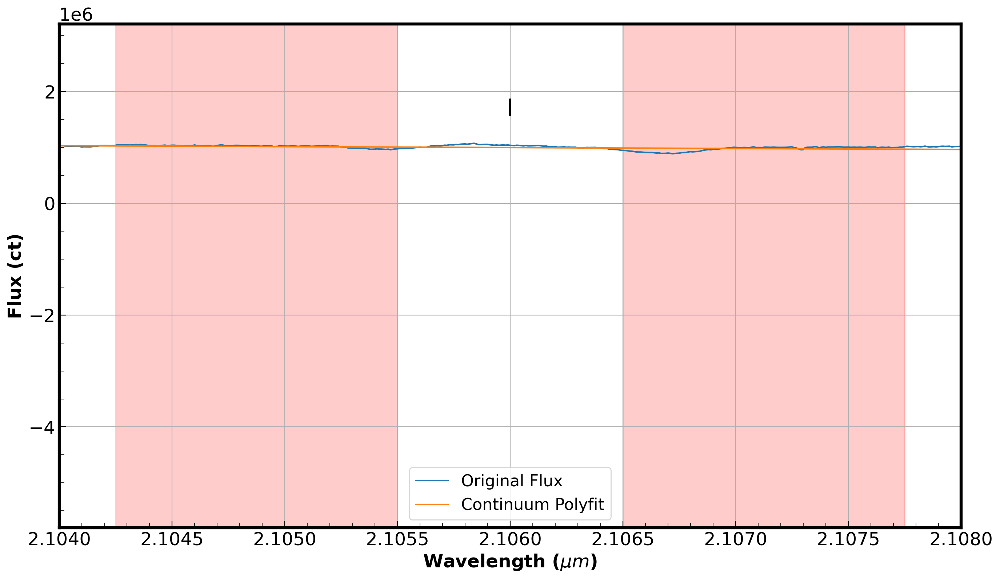

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-6.55346691e-05  2.10673358e+00  2.21127633e-04  1.02969960e+00]


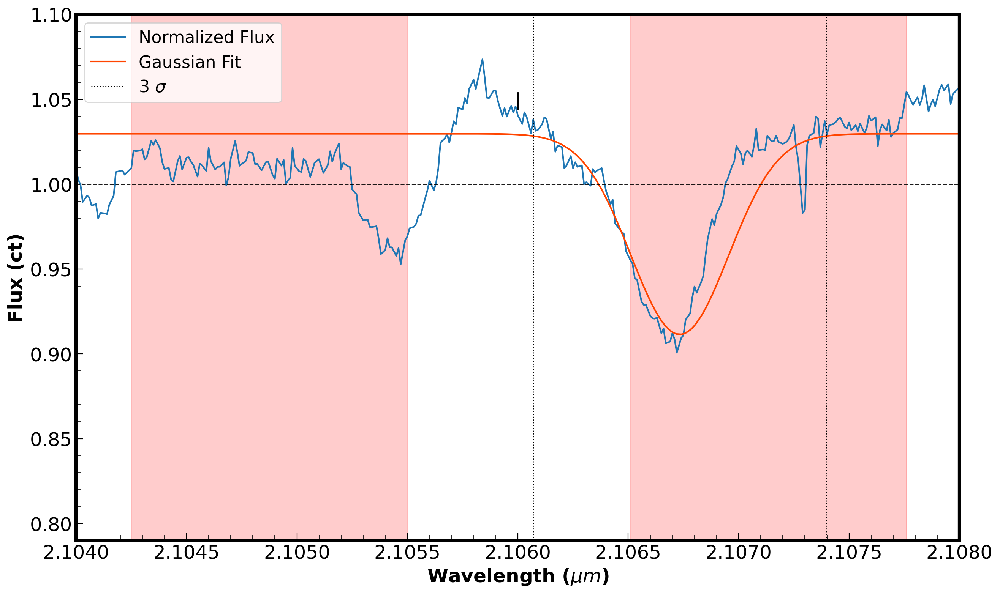

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0292184755761118
Relative Absorption: -0.02921847557611179
Half Max Flux: 1.014609237788056
Half Relative Absorption: -0.014609237788055895


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-2.1643408512231268e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000020?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000020


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[3]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

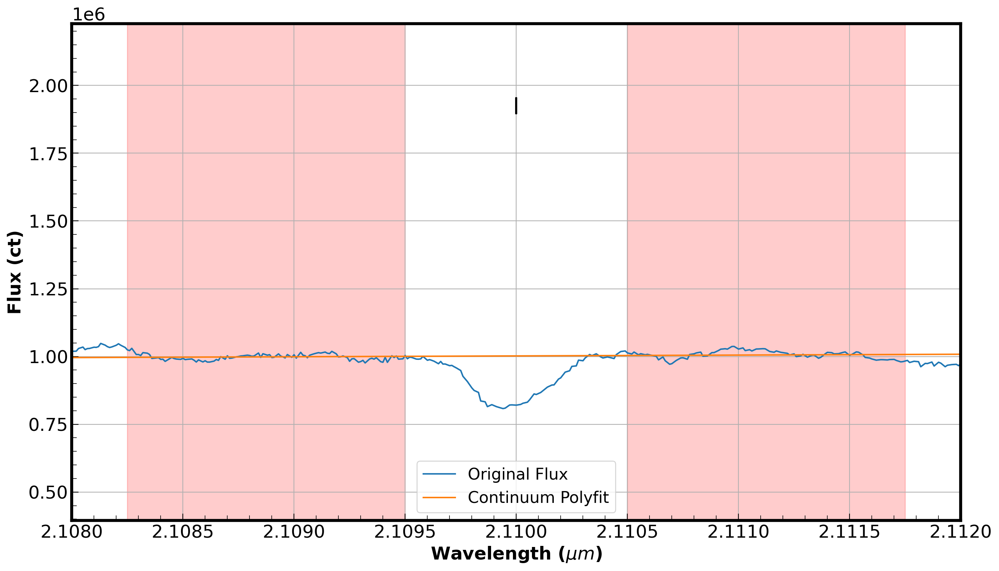

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.75e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-8.23726747e-05  2.10997074e+00  1.63464567e-04  1.00626395e+00]


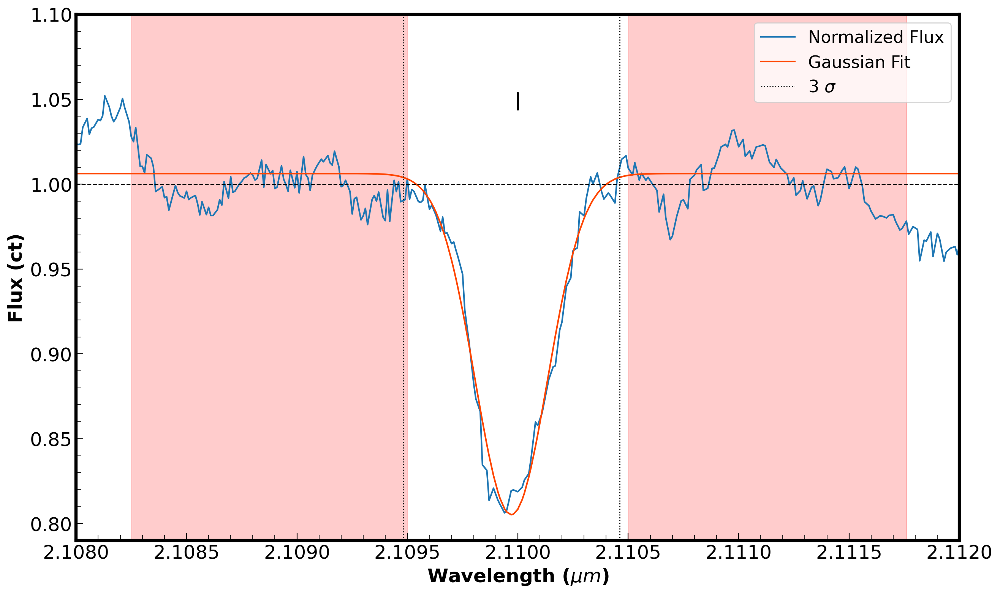

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.8084025319590513
Relative Absorption: 0.19159746804094868
Half Max Flux: 0.9042012659795257
Half Relative Absorption: 0.09579873402047434


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

9.07040957506834e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000076?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000076


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[4]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

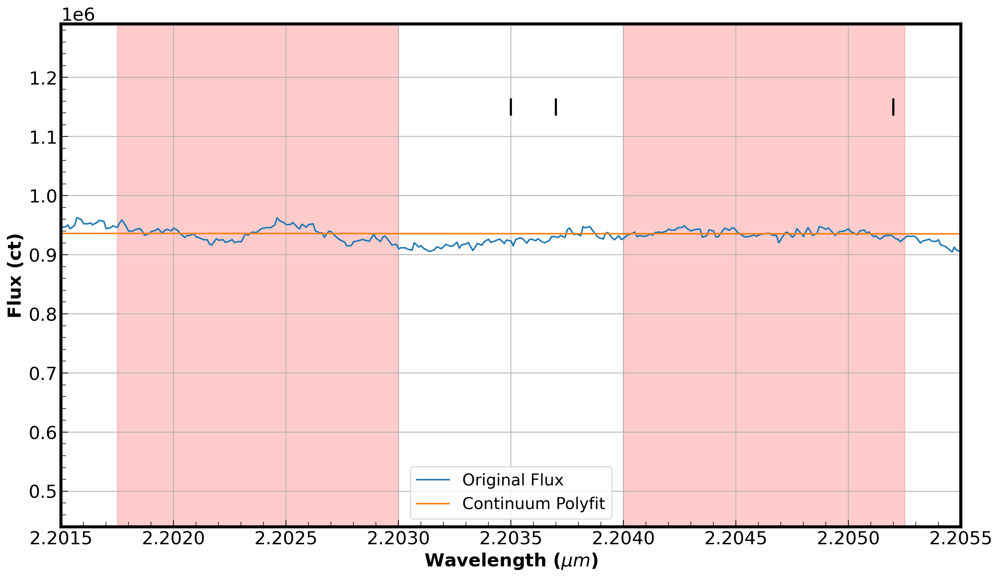

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9e6,1.05e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-2.20254390e-05  2.20308267e+00  3.39232708e-04  9.99730106e-01]


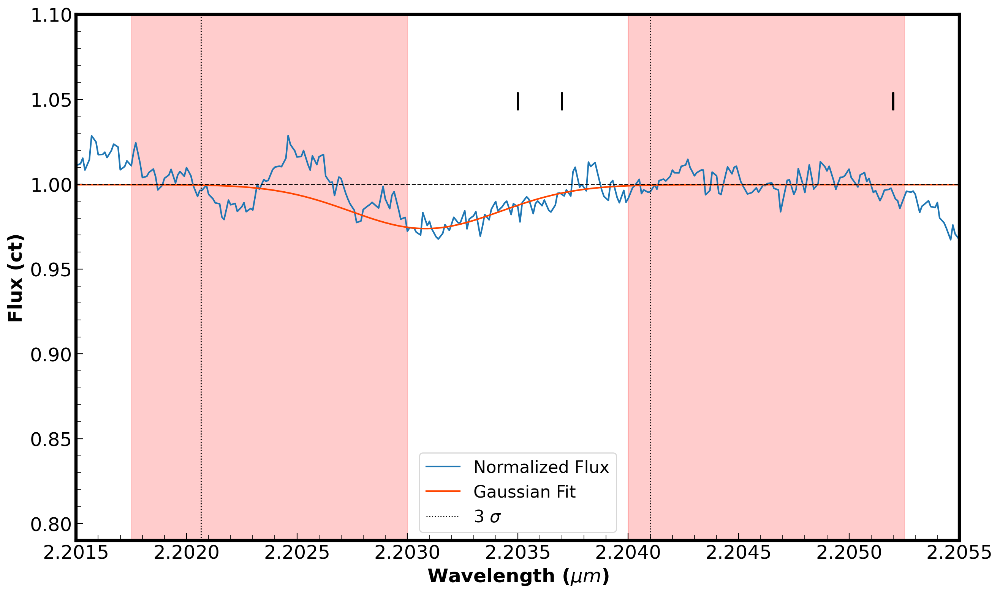

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9875766356737488
Relative Absorption: 0.01242336432625124
Half Max Flux: 0.9937883178368744
Half Relative Absorption: 0.00621168216312562


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

1.147387456365156e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000013?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000013


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[5]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

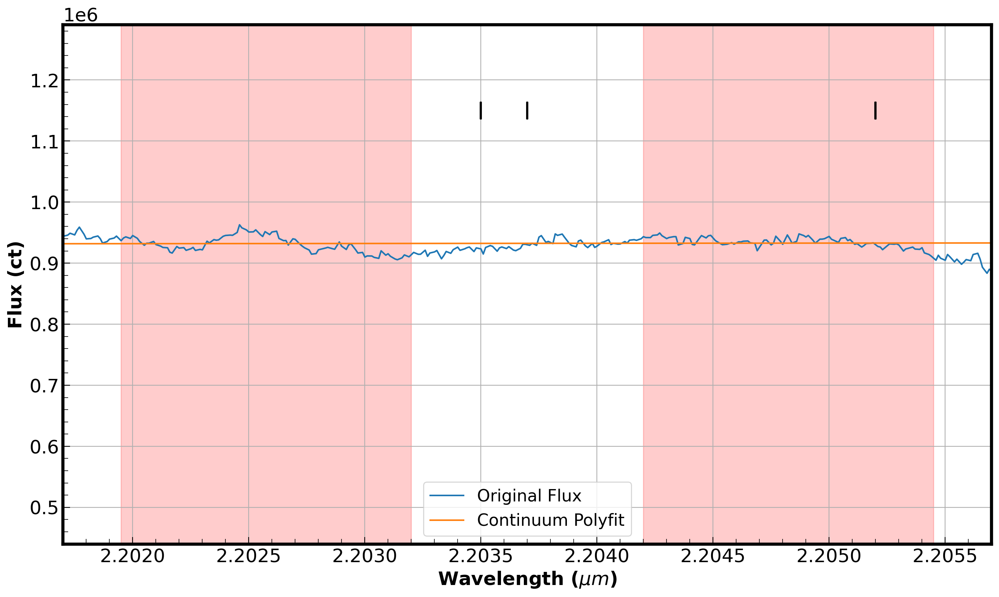

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.9e6,1.0e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-1.36566073e-05  2.20323929e+00  2.63003875e-04  1.00305307e+00]


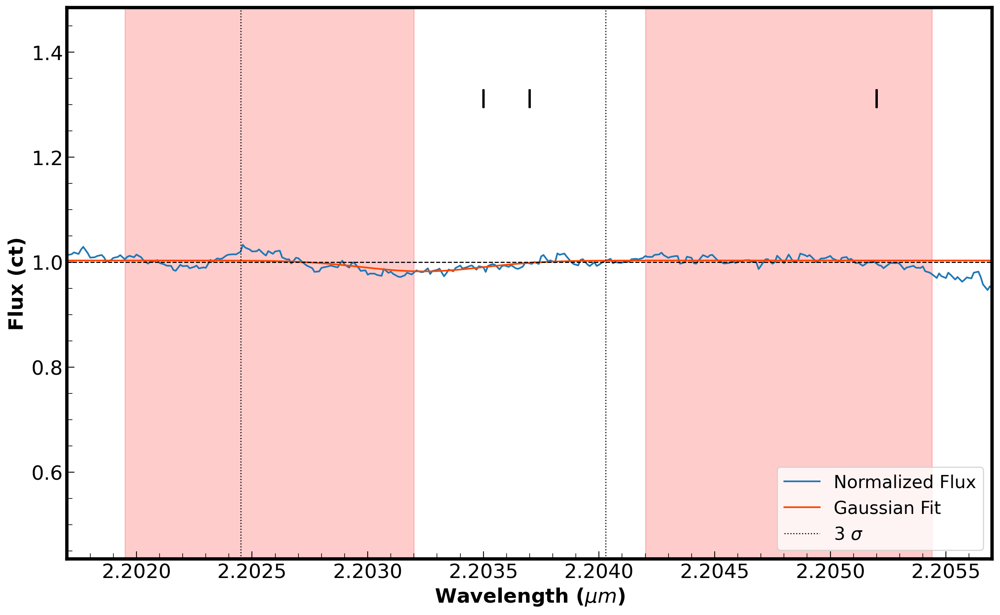

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.8,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9982855158276074
Relative Absorption: 0.0017144841723926163
Half Max Flux: 0.9991427579138037
Half Relative Absorption: 0.0008572420861963082


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

1.0828463284628128e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000005?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000005


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[6]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

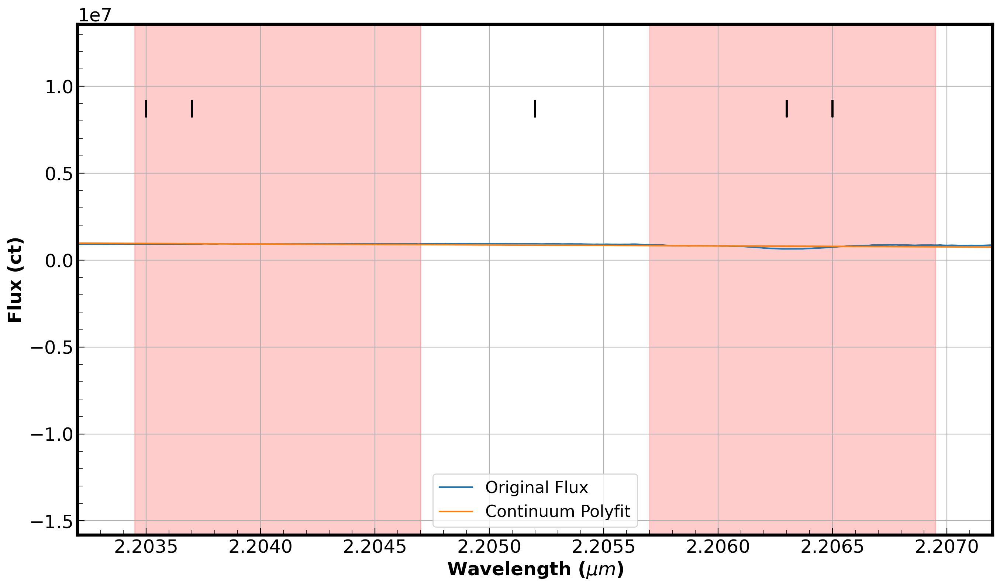

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.8e7,0.5e7)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-2.02207956e-05  2.20454507e+00  1.78667142e-04  1.07611516e+00]


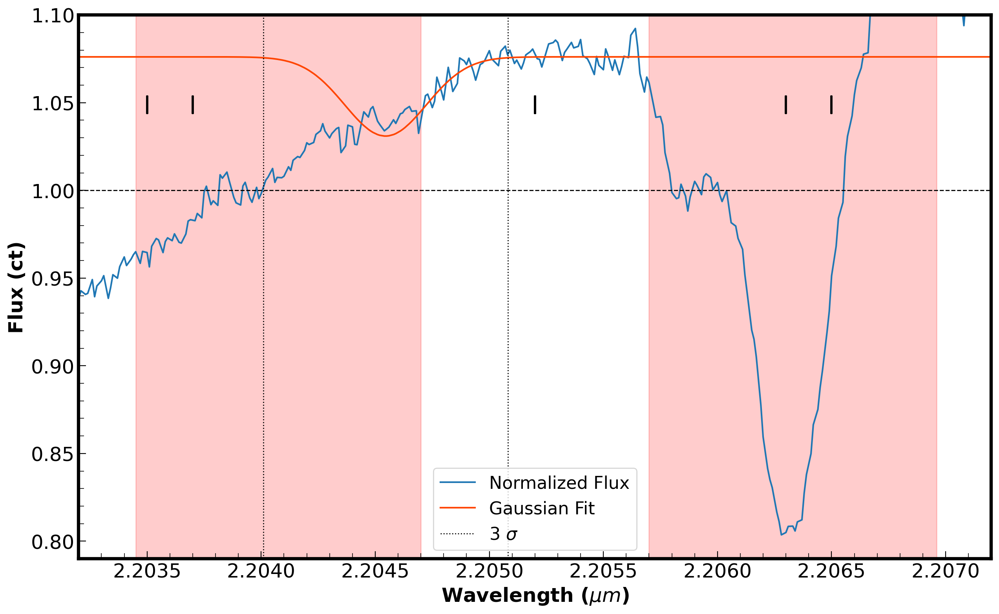

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0760707873050865
Relative Absorption: -0.07607078730508654
Half Max Flux: 1.0380353936525433
Half Relative Absorption: -0.03803539365254327


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-3.127248835316388e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000072?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000072


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[7]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

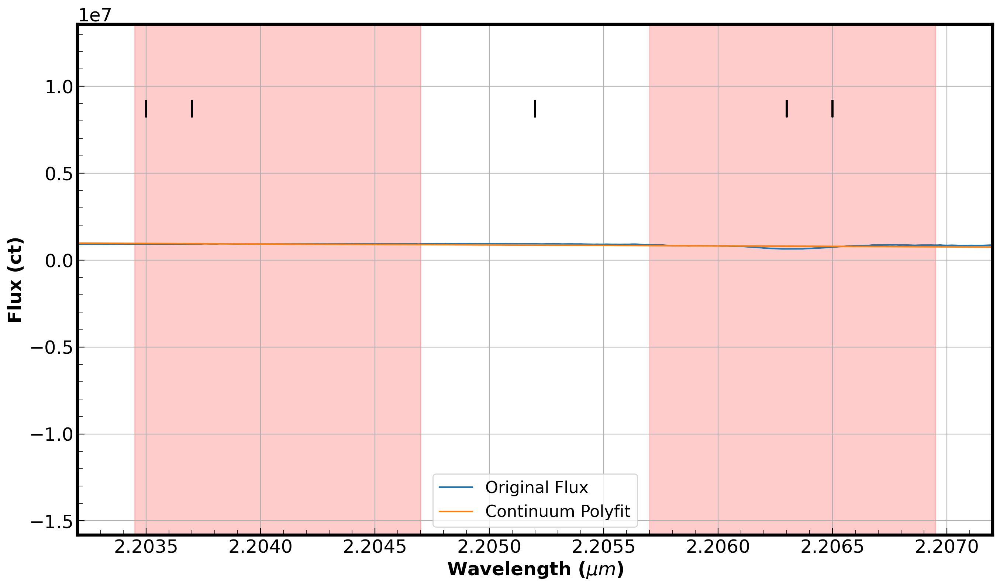

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-2.02207956e-05  2.20454507e+00  1.78667142e-04  1.07611516e+00]


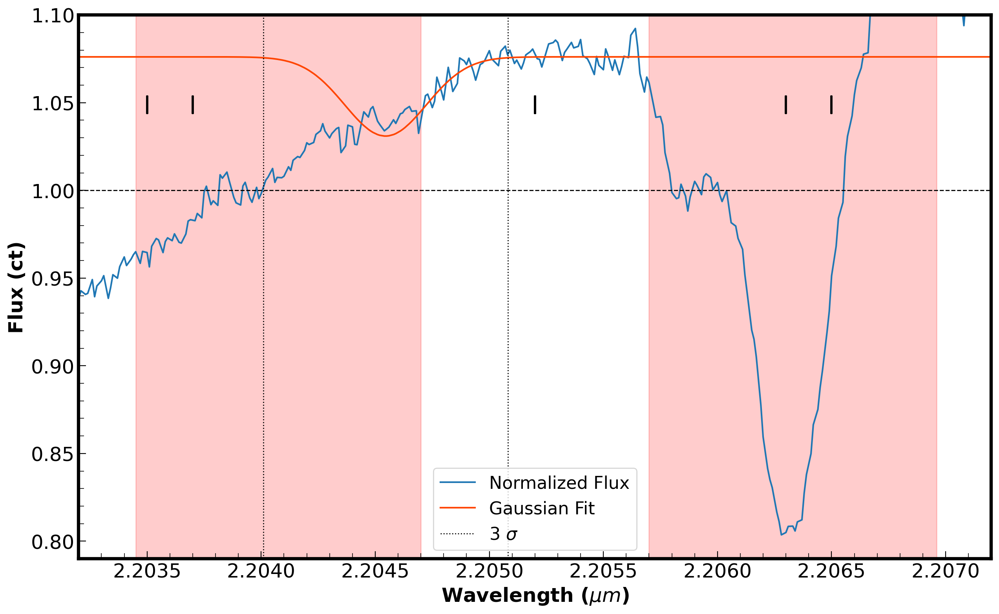

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0760707873050865
Relative Absorption: -0.07607078730508654
Half Max Flux: 1.0380353936525433
Half Relative Absorption: -0.03803539365254327


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-3.127248835316388e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000072?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000072


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[8]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

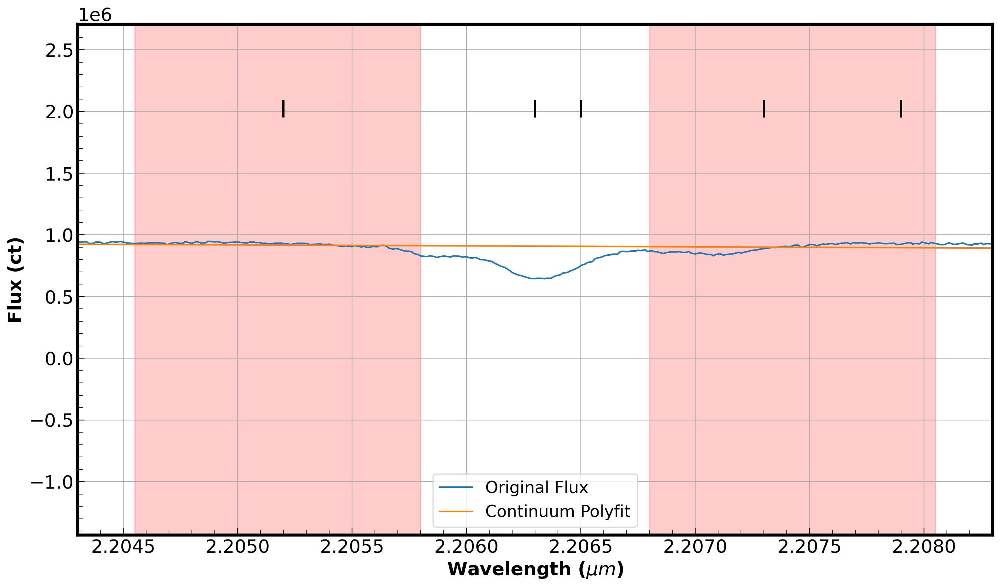

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-8.29937386e-05  2.20631568e+00  1.44240680e-04  9.34558556e-01]


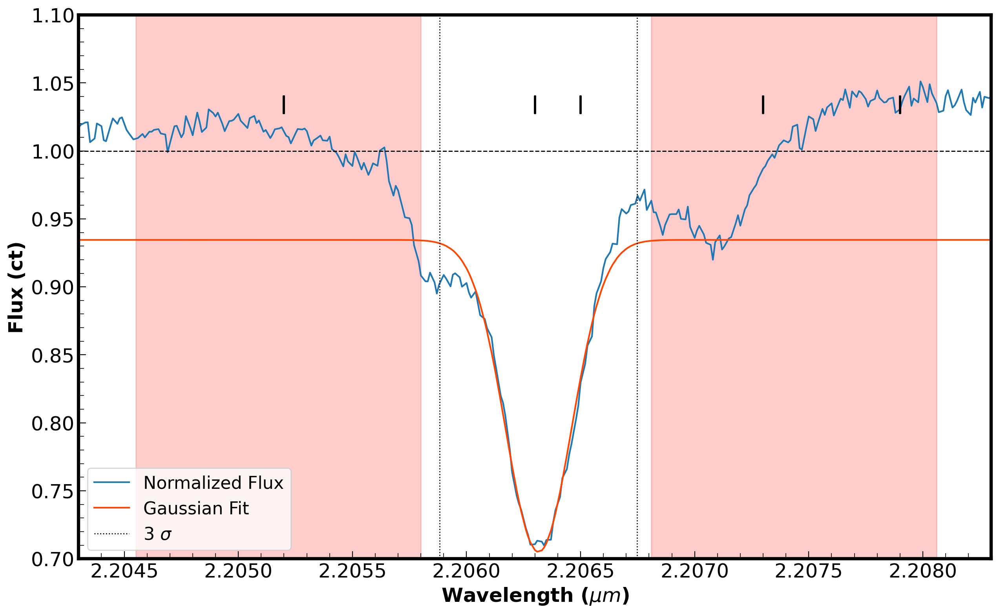

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.7,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.7063666657551372
Relative Absorption: 0.2936333342448628
Half Max Flux: 0.8531833328775686
Half Relative Absorption: 0.1468166671224314


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

0.00014719784019054011

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000149?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000149


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[9]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

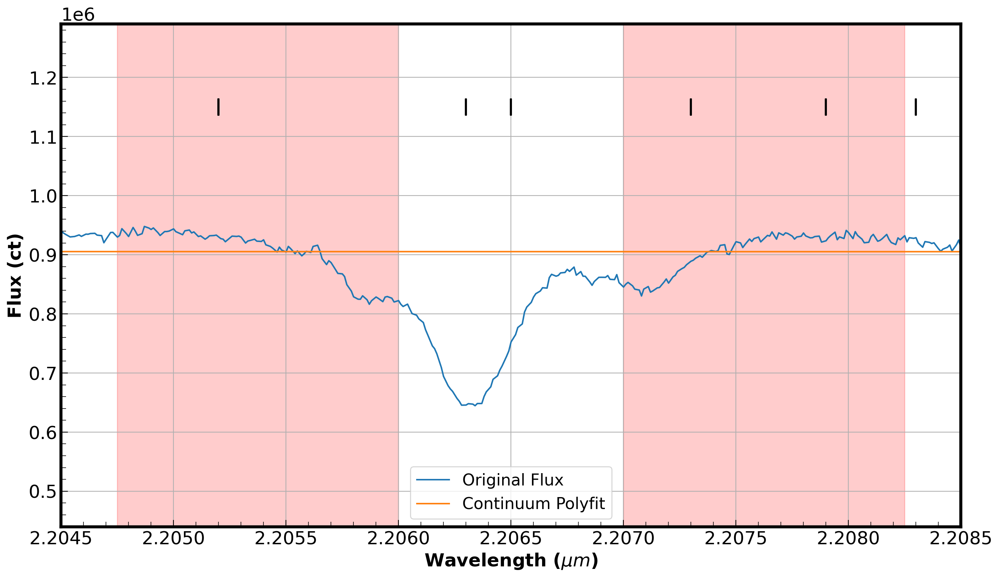

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-9.51064574e-05  2.20631854e+00  1.54152690e-04  9.55015445e-01]


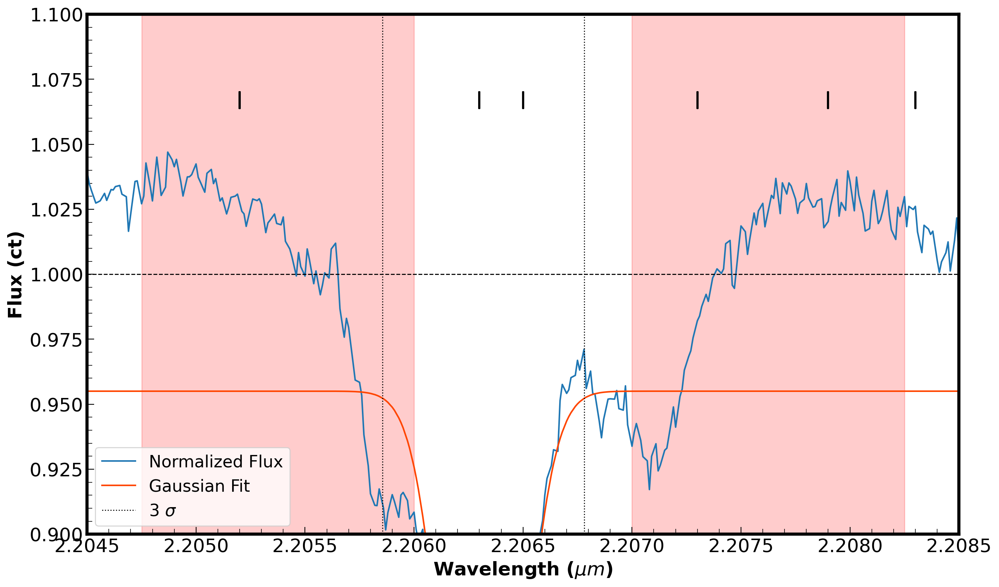

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.8320044928787754
Relative Absorption: 0.16799550712122457
Half Max Flux: 0.9160022464393878
Half Relative Absorption: 0.08399775356061229


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

7.840763755275328e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width: {ew1:.7f}?")

Equivalent Width: 0.0001380?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width: {ew2:.7f}")

Equivalent Width: 0.0001382


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[10]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

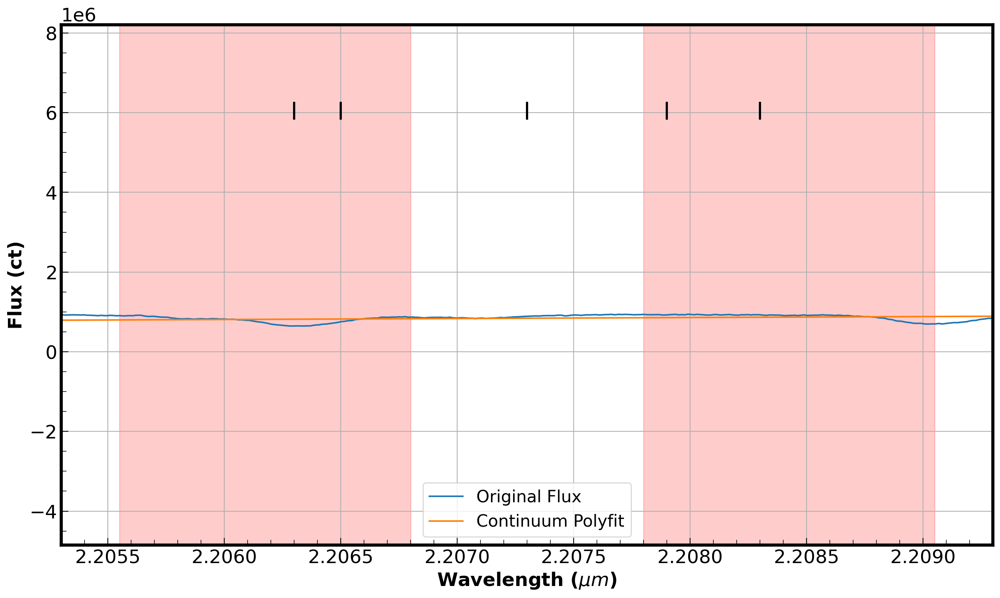

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 10000.

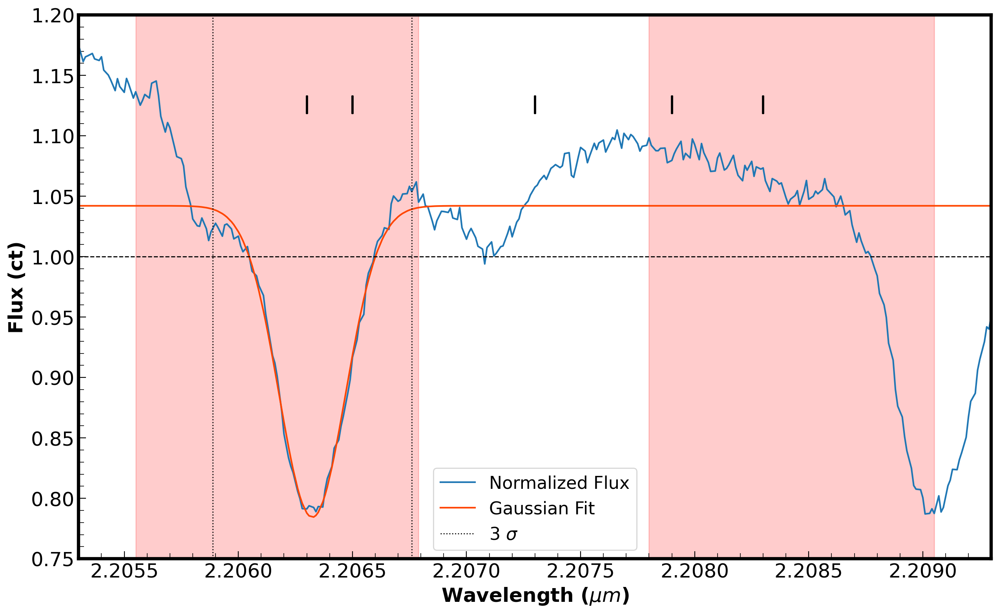

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.75,1.2)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0420827734120037
Relative Absorption: -0.04208277341200373
Half Max Flux: 1.0210413867060018
Half Relative Absorption: -0.021041386706001863


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-1.9807191834177417e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000056?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000042


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[11]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

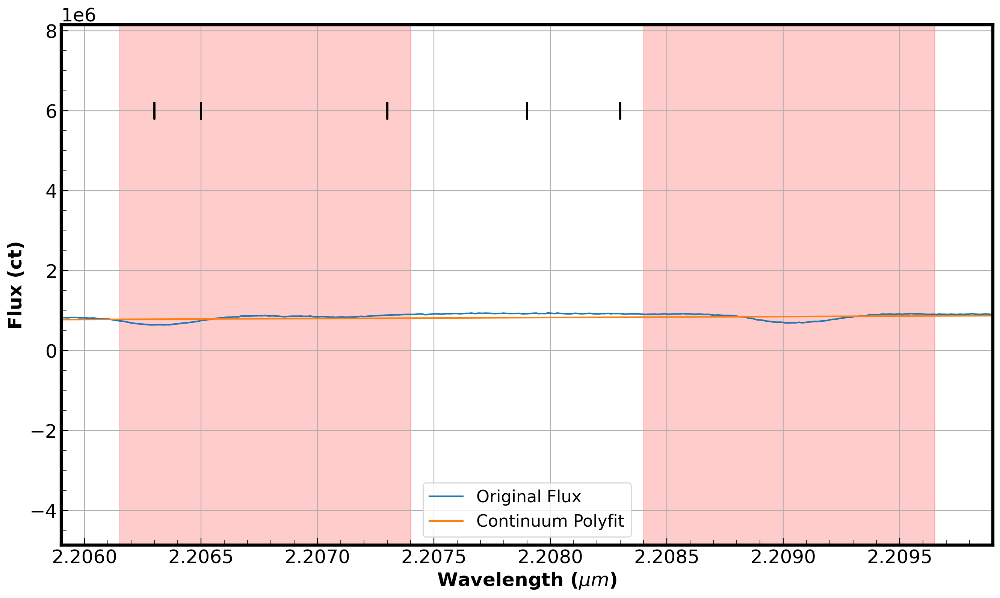

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [3.60168739e-04 2.20775320e+00 6.73833339e-04 9.32703464e-01]


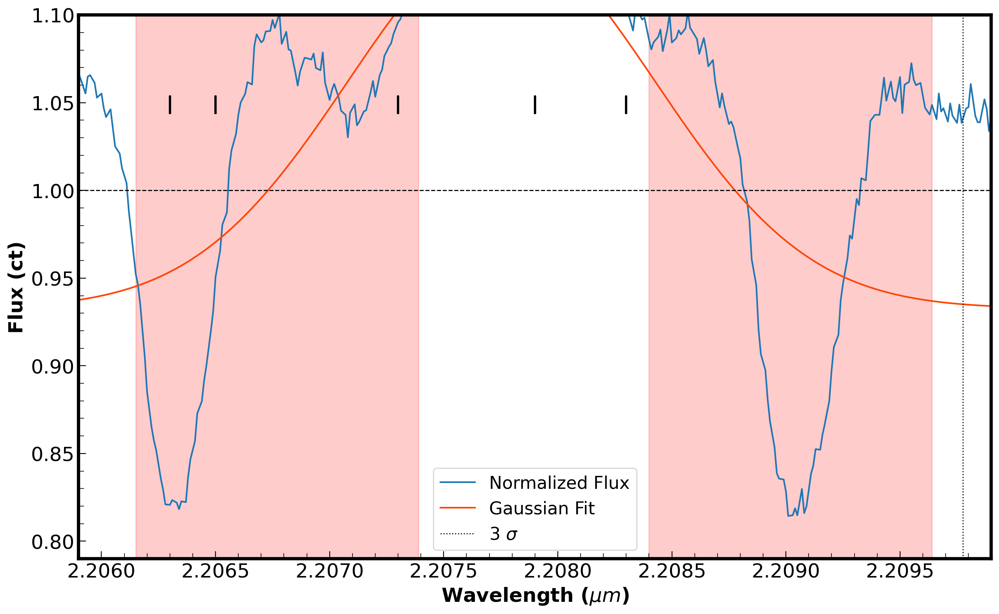

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.1409400035405057
Relative Absorption: -0.14094000354050573
Half Max Flux: 1.0704700017702529
Half Relative Absorption: -0.07047000177025287


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-0.00017848792669912904

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000122?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000125


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[12]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

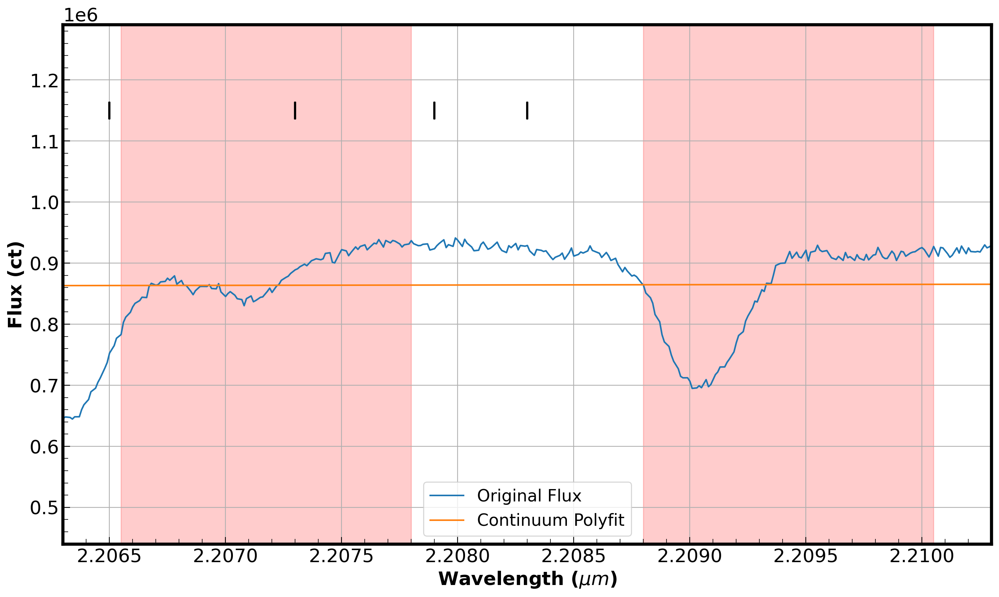

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-9.00984062e-05  2.20905140e+00  1.46148989e-04  1.04344362e+00]


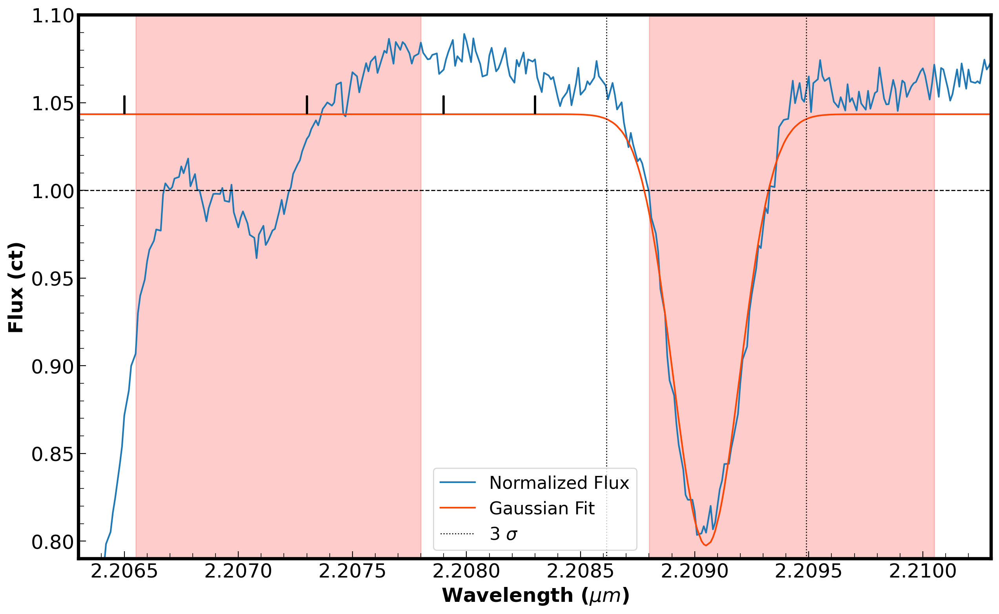

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.043443171716101
Relative Absorption: -0.043443171716101014
Half Max Flux: 1.0217215858580504
Half Relative Absorption: -0.021721585858050507


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-2.545961941805212e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000062?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000040


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[13]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

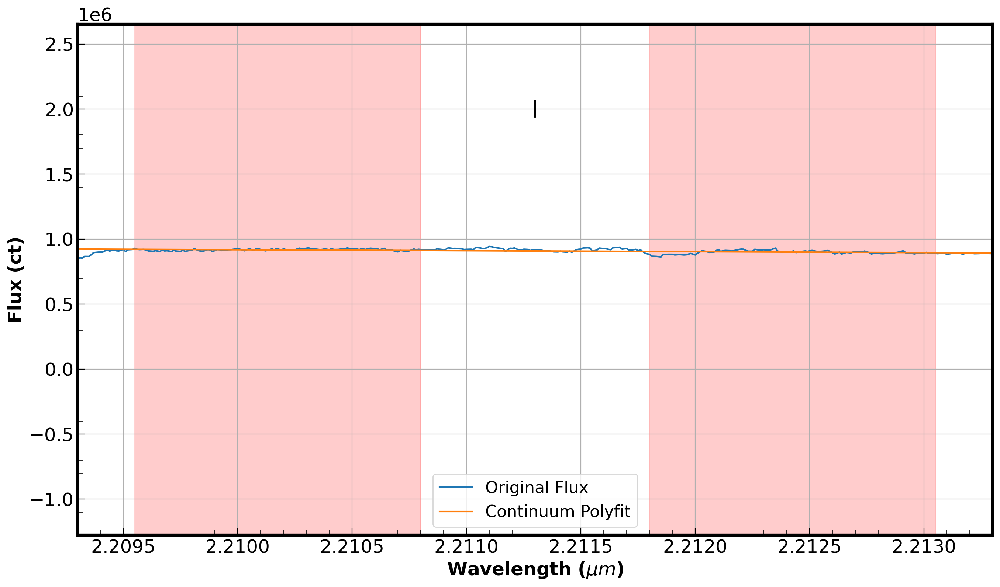

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [ 0.12138298  2.21130386  0.01636431 -1.94968213]


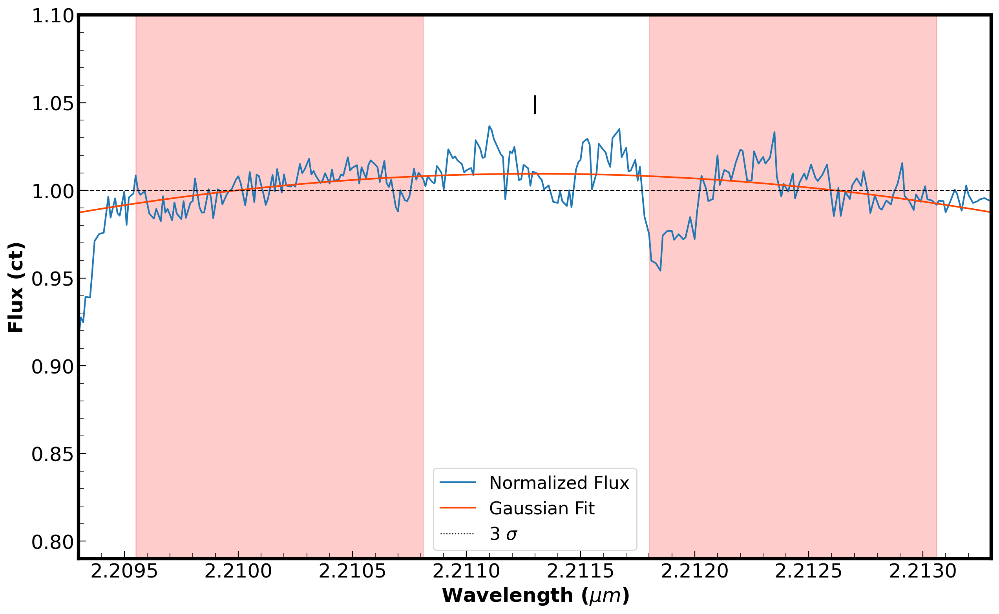

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0094893944249672
Relative Absorption: -0.009489394424967212
Half Max Flux: 1.0047446972124836
Half Relative Absorption: -0.004744697212483606


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-0.00039030716573910116

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000013?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000009


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[14]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

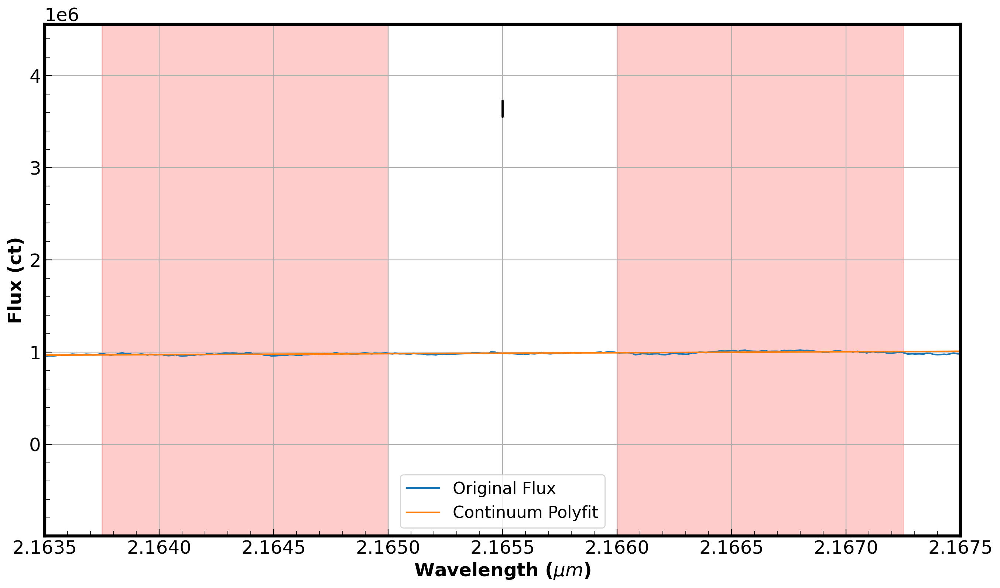

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-9.15277820e-06  2.16545739e+00  6.39885105e-04  1.00197042e+00]


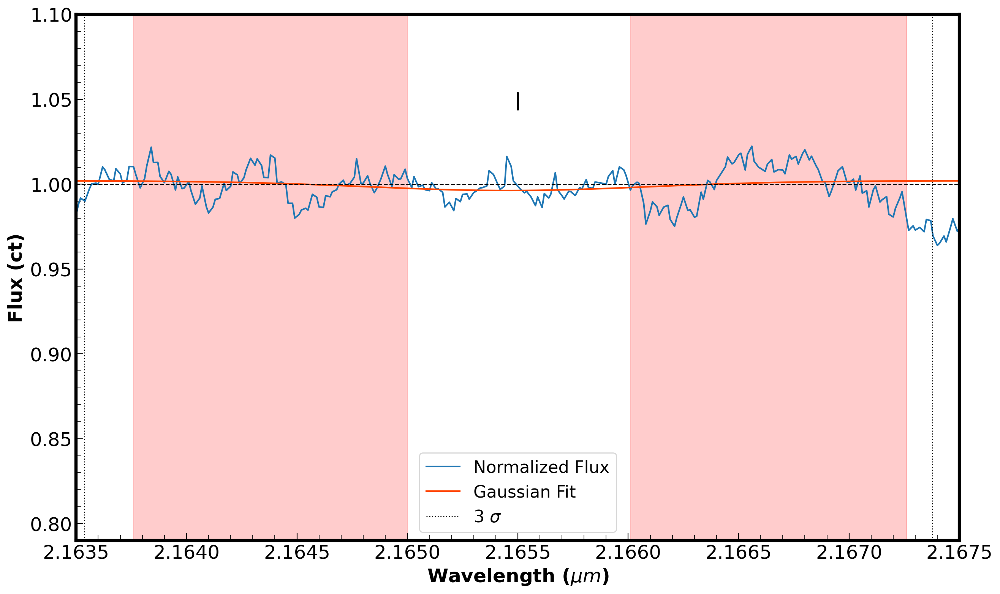

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9962766220007957
Relative Absorption: 0.0037233779992043026
Half Max Flux: 0.9981383110003978
Half Relative Absorption: 0.0018616889996021513


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

1.7950637855042171e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000002?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000003


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[15]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

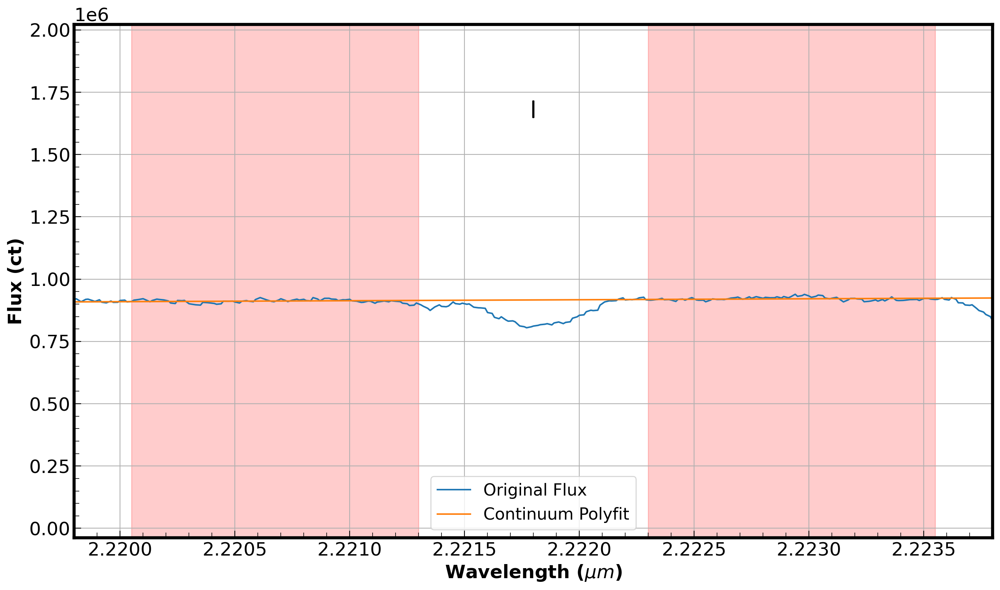

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-4.97139941e-05  2.22181343e+00  1.69306767e-04  9.99630071e-01]


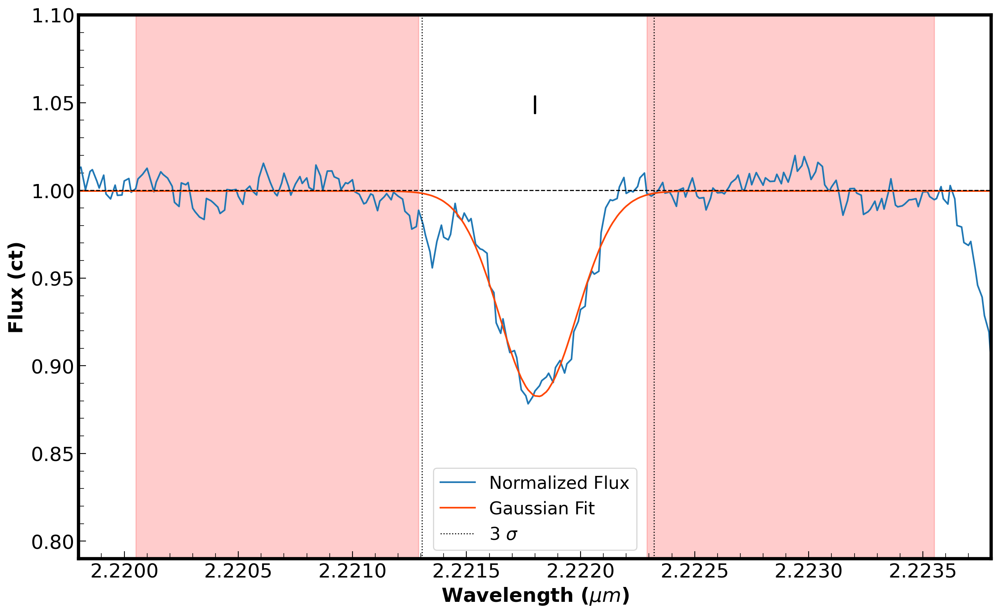

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.8828501639296156
Relative Absorption: 0.11714983607038443
Half Max Flux: 0.9414250819648078
Half Relative Absorption: 0.058574918035192214


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

5.480051493307238e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000051?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000050


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[16]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

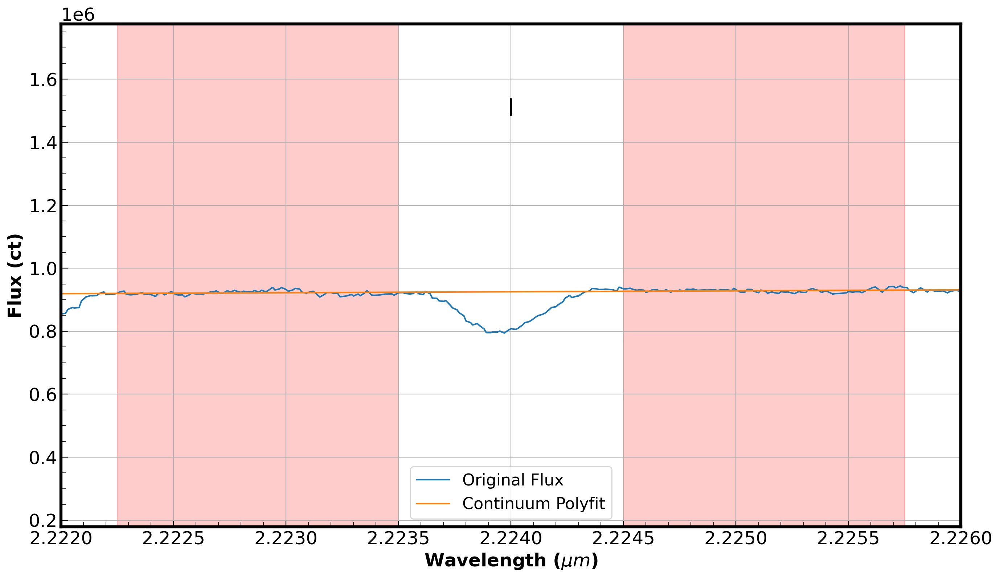

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-5.58531104e-05  2.22395640e+00  1.56238053e-04  1.00068371e+00]


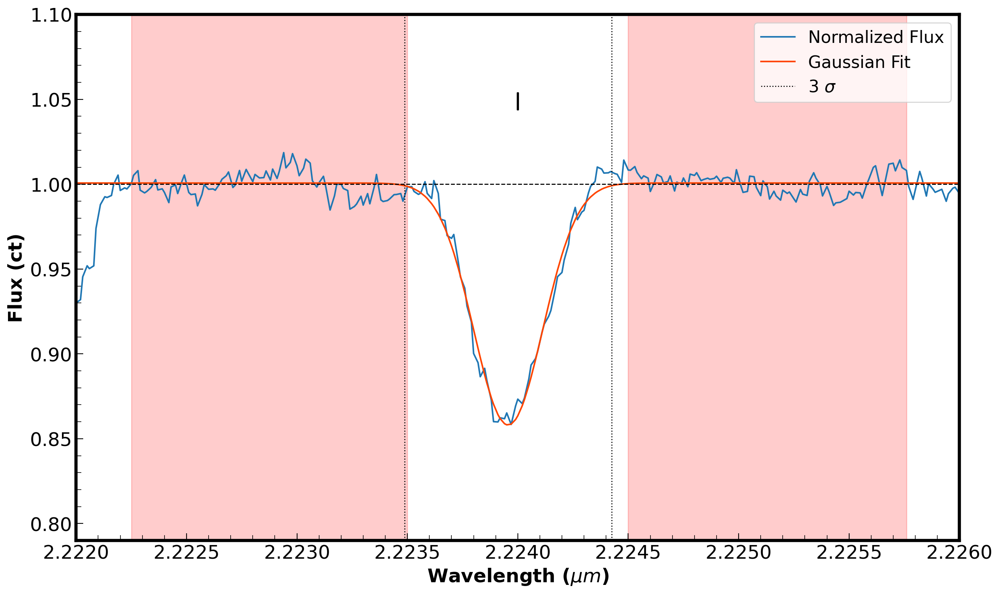

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.8635132398441345
Relative Absorption: 0.13648676015586547
Half Max Flux: 0.9317566199220673
Half Relative Absorption: 0.06824338007793274


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

5.68053407731962e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000053?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000055


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[17]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

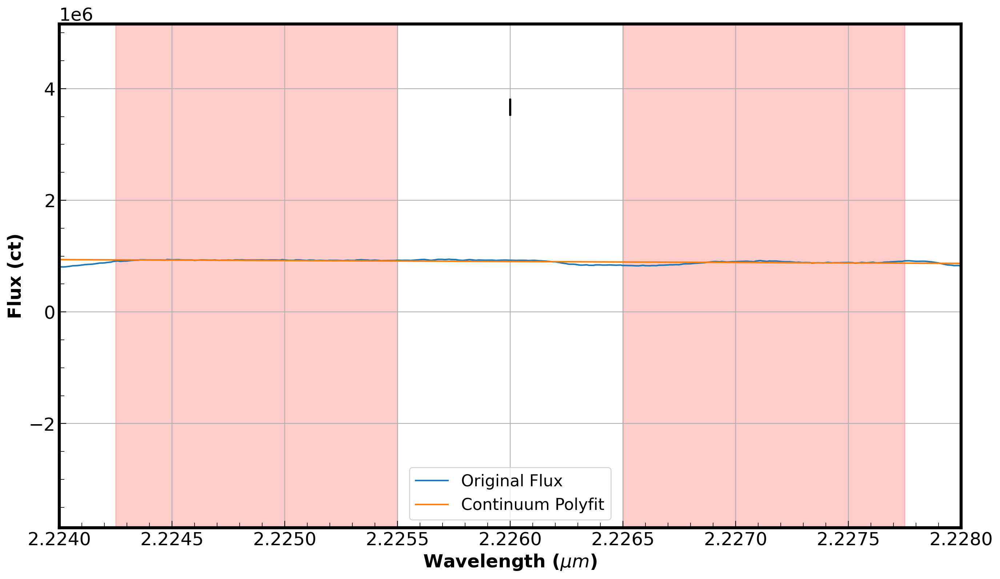

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-4.59846679e-05  2.22652075e+00  1.95327007e-04  1.01320656e+00]


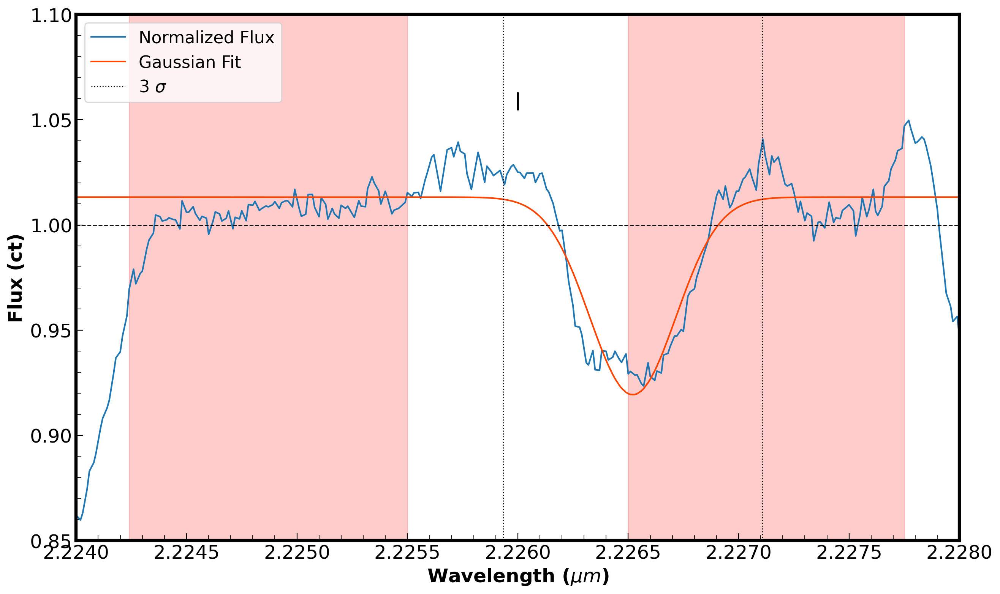

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.85,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.010515419068179
Relative Absorption: -0.0105154190681791
Half Max Flux: 1.0052577095340895
Half Relative Absorption: -0.00525770953408955


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-1.1986570138300427e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000000?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000008


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[18]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

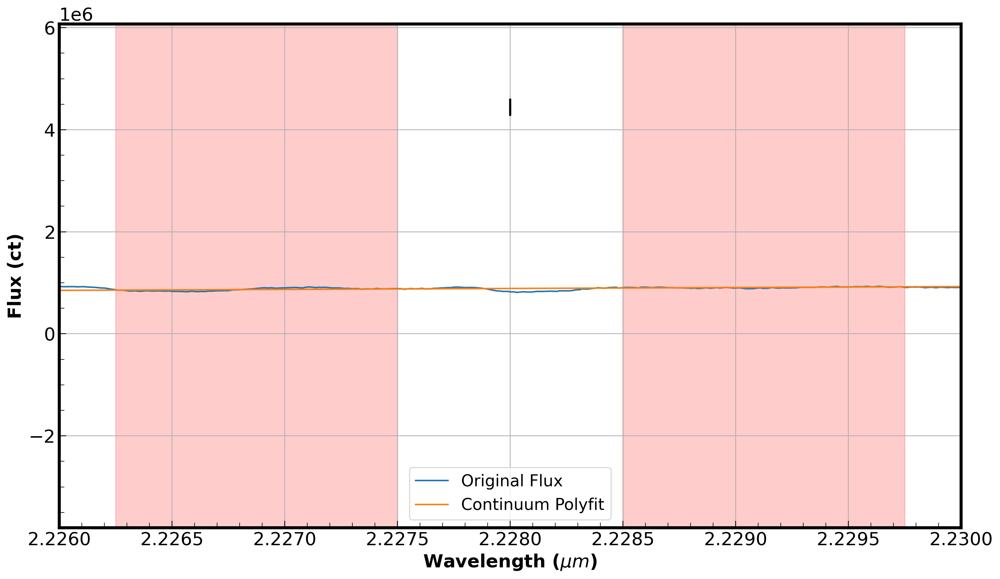

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-2.72237586e-05  2.22810846e+00  1.23654871e-04  1.00186367e+00]


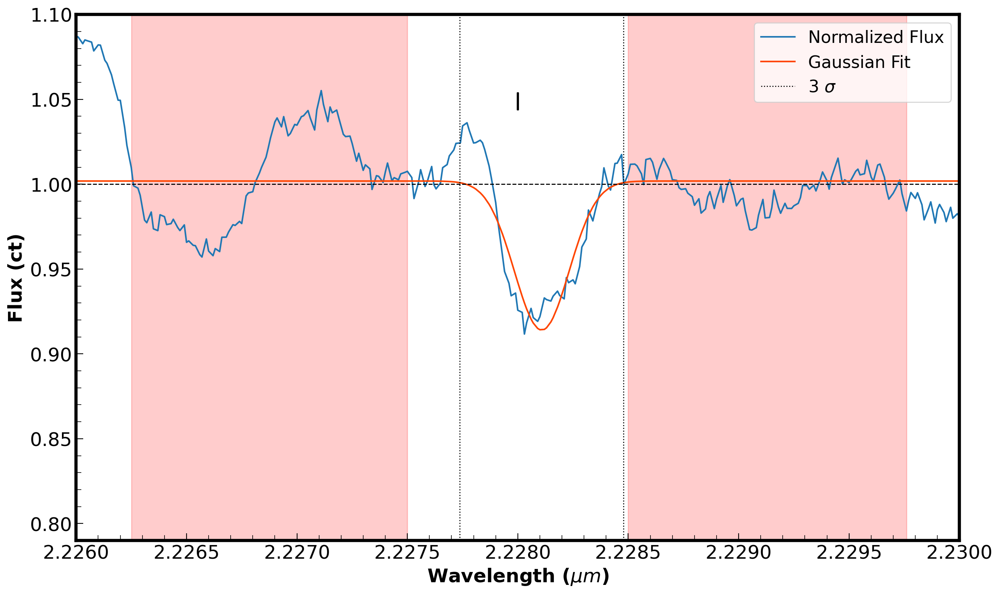

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
        # ax.text(x=lines_wav[ii],y=1.1,s=lines_str[ii][0:2],ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9421210921812588
Relative Absorption: 0.057878907818741165
Half Max Flux: 0.9710605460906294
Half Relative Absorption: 0.028939453909370583


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

2.4867329402086758e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000020?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000025


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[19]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

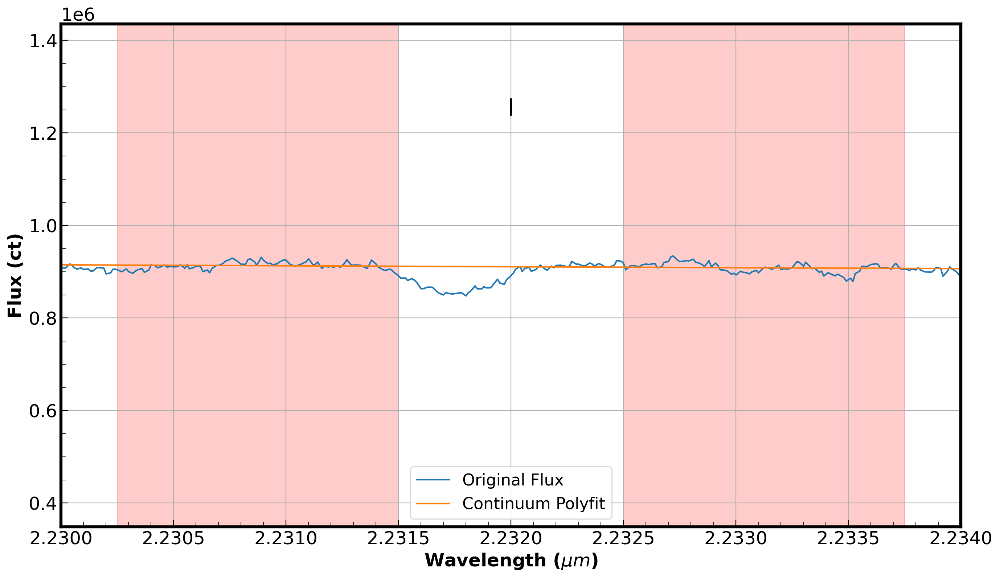

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-2.74839352e-05  2.23175279e+00  1.60634121e-04  1.00113136e+00]


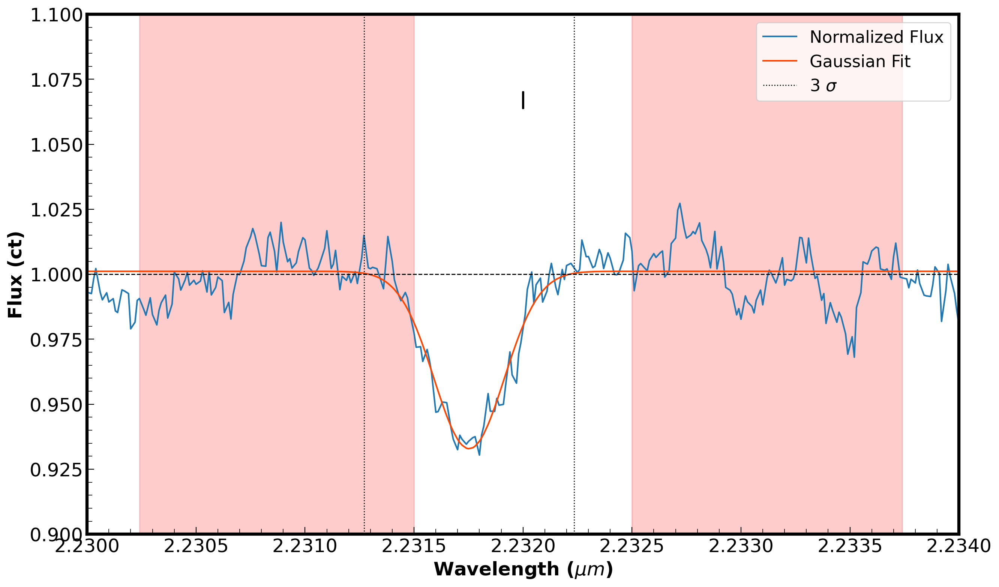

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9821712757603952
Relative Absorption: 0.0178287242396048
Half Max Flux: 0.9910856378801975
Half Relative Absorption: 0.0089143621198024


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

6.350685258653939e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000024?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000025


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[20]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

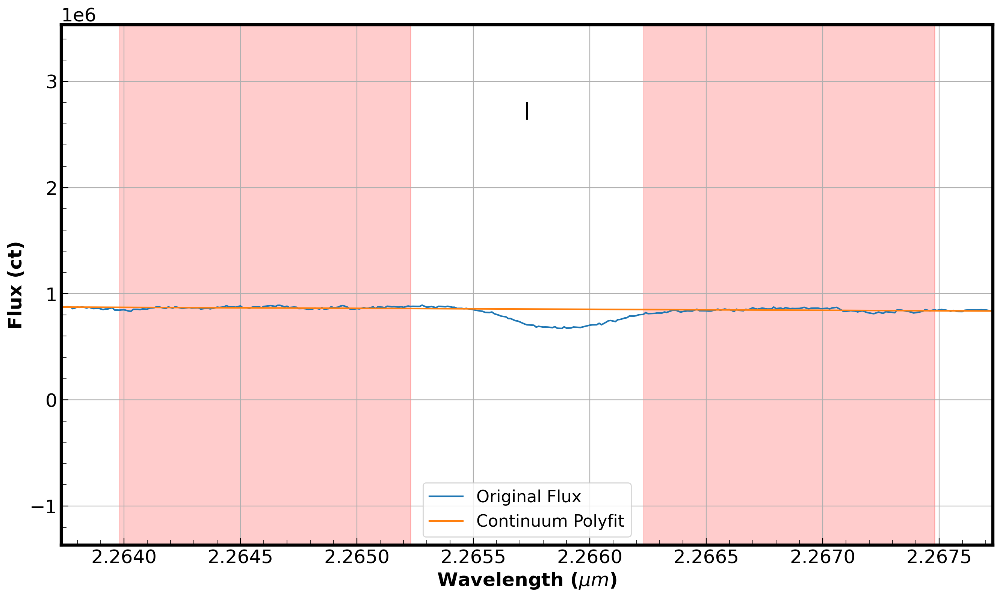

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [7.18399531e-05 2.26474390e+00 4.12878617e-04 9.52508784e-01]


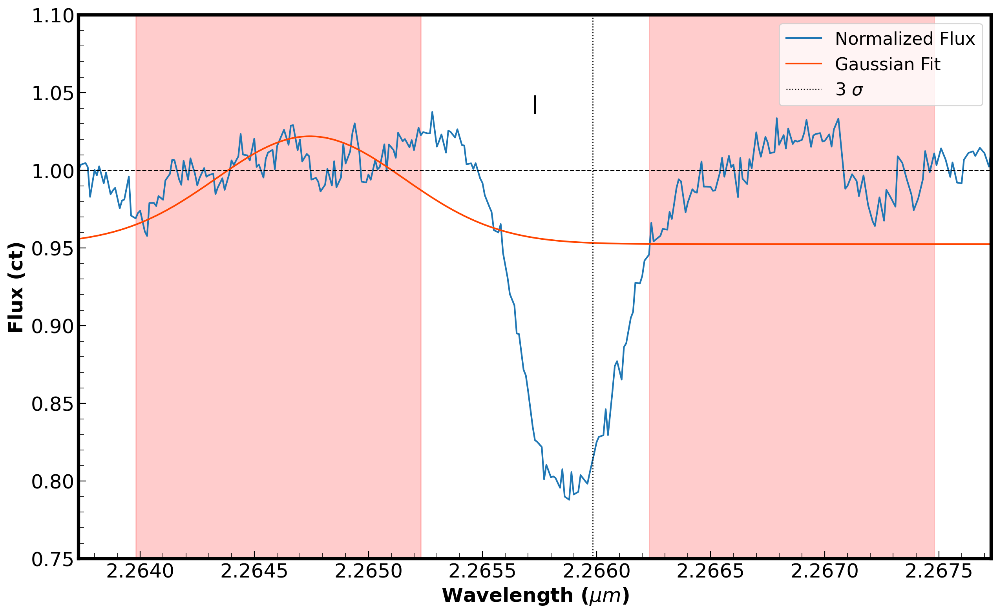

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.75,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9565179338548373
Relative Absorption: 0.0434820661451627
Half Max Flux: 0.9782589669274186
Half Relative Absorption: 0.02174103307258135


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

0.00021747760155665615

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000093?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000039


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[21]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

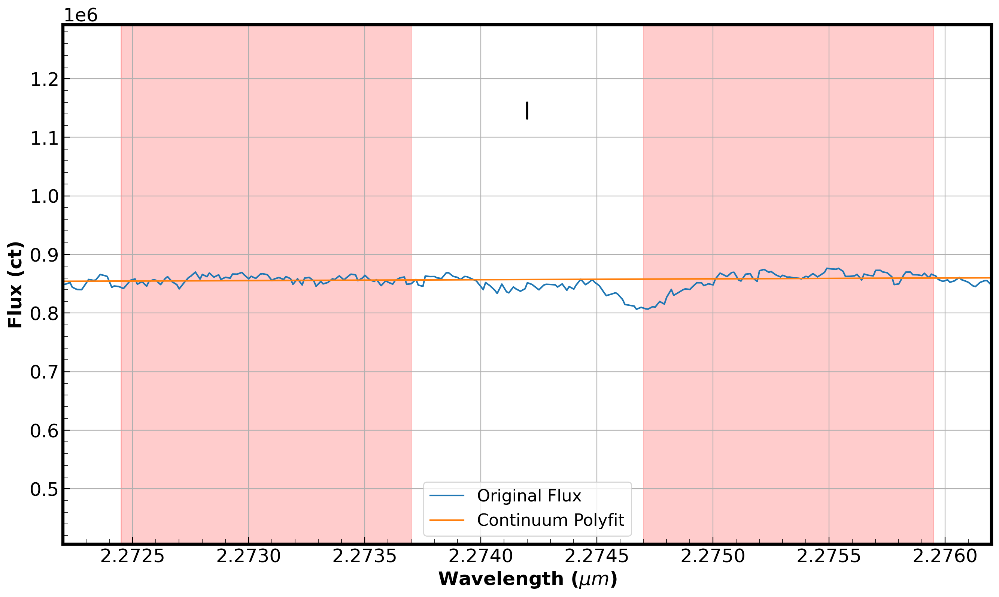

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-1.86393554e-05  2.27469912e+00  1.29679596e-04  1.00138311e+00]


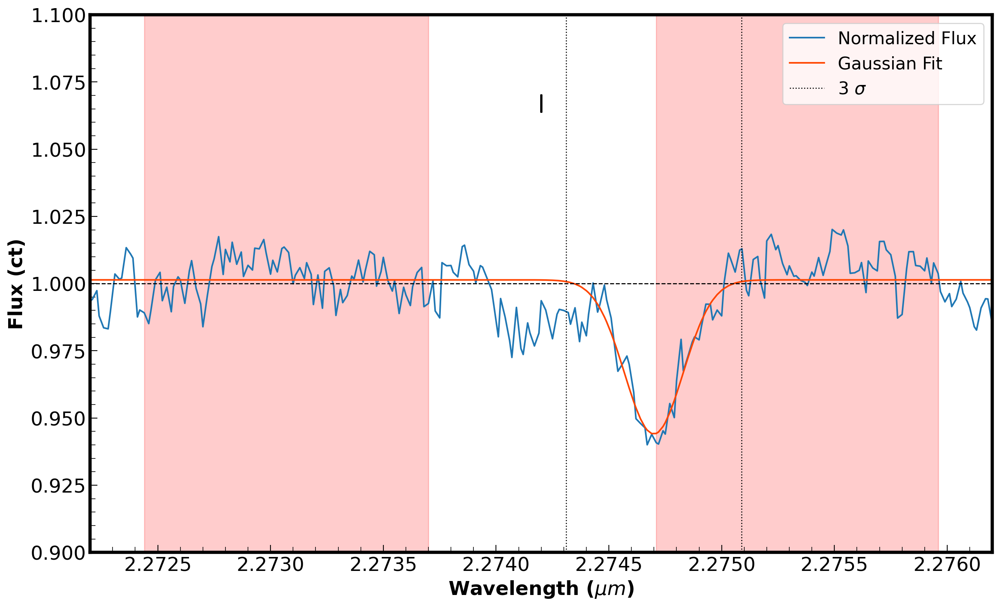

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.001348301172254
Relative Absorption: -0.0013483011722539295
Half Max Flux: 1.000674150586127
Half Relative Absorption: -0.0006741505861269648


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

2.0841527905560563e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000014?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000009


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[22]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

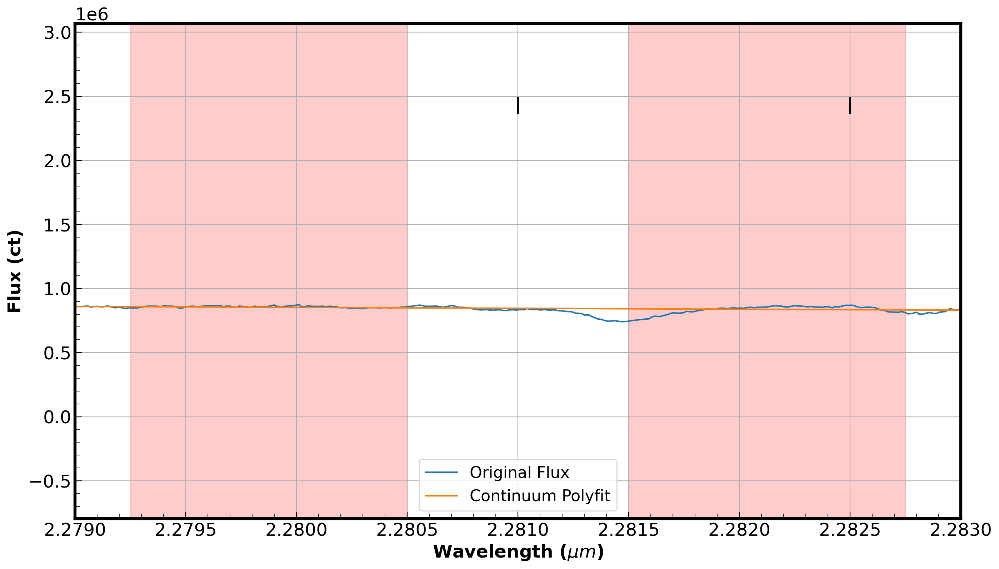

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-5.27717082e-05  2.28147522e+00  1.72710918e-04  1.00802883e+00]


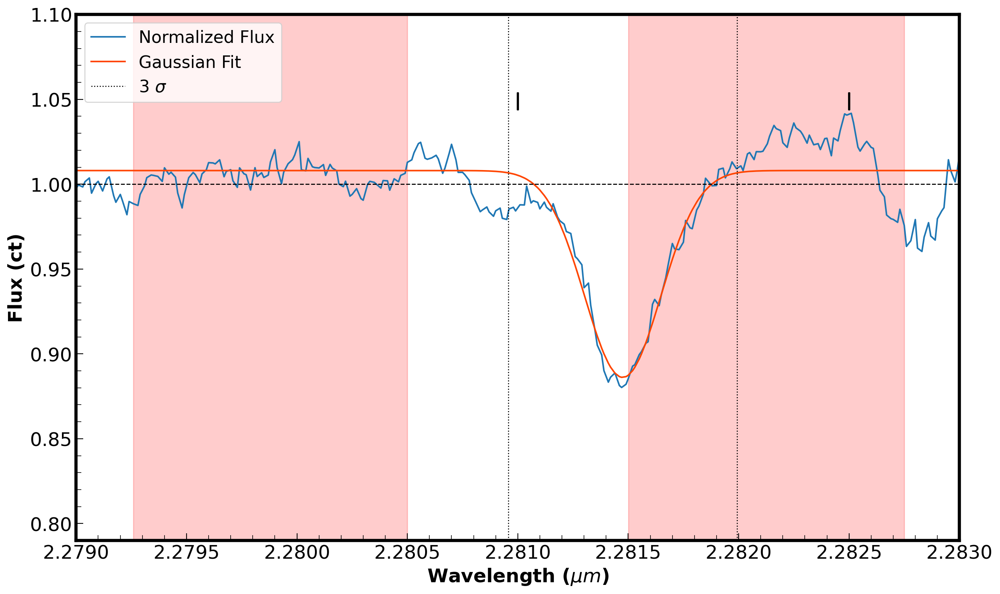

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.0047946439789985
Relative Absorption: -0.004794643978998536
Half Max Flux: 1.0023973219894993
Half Relative Absorption: -0.002397321989499268


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

5.327780465330947e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000025?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000021


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[23]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

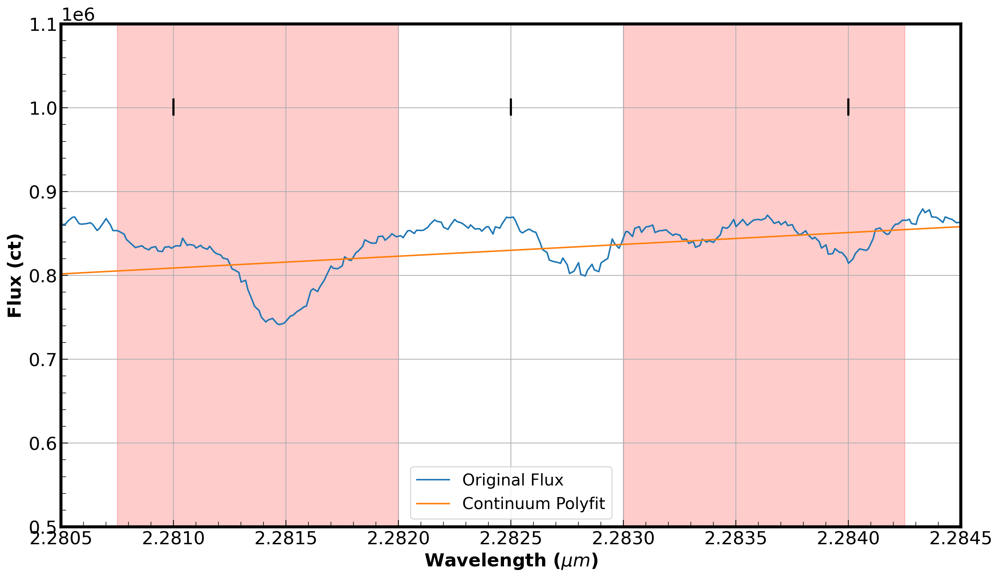

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(.5e6,1.1e6)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-9.51003144e-06  2.28399145e+00  8.88955895e-05  1.00711059e+00]


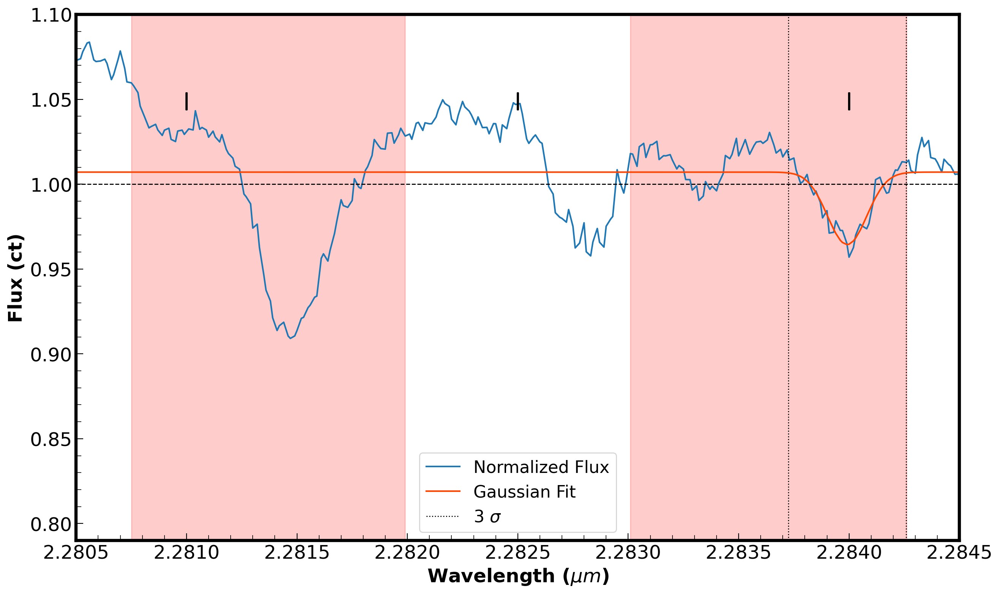

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.79,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 1.007110593166816
Relative Absorption: -0.007110593166816059
Half Max Flux: 1.003555296583408
Half Relative Absorption: -0.0035552965834080297


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-1.0100576420719085e-05

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000016?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: -0.000007


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[24]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

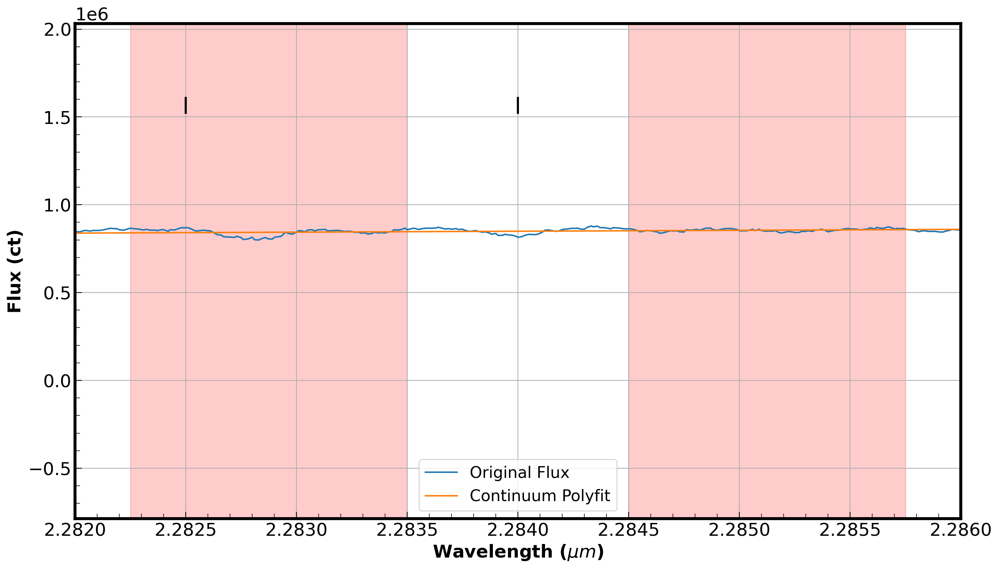

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-17.36710908   2.28399688   0.12853832  54.9016826 ]


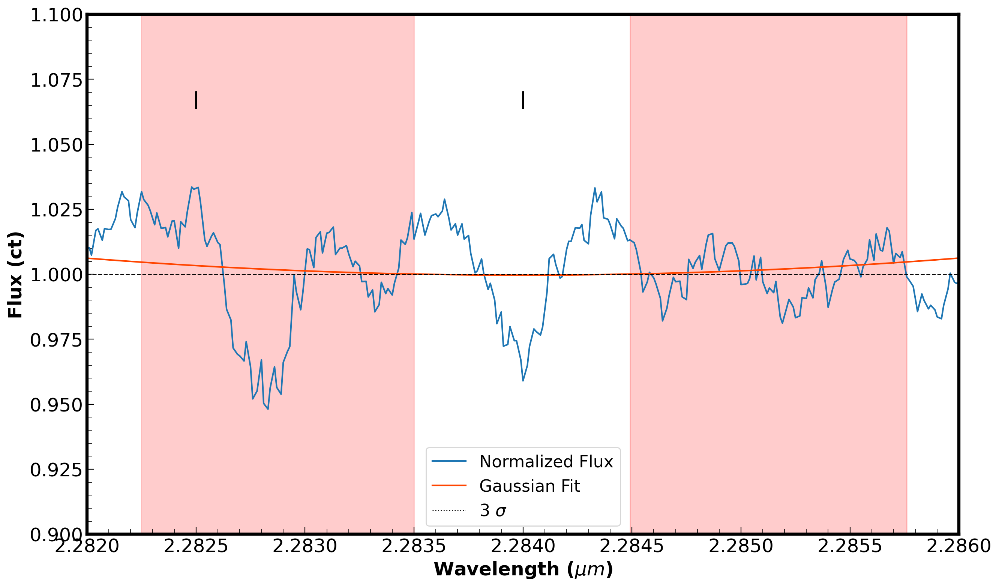

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.9996700468159503
Relative Absorption: 0.00032995318404971385
Half Max Flux: 0.9998350234079751
Half Relative Absorption: 0.00016497659202485693


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

0.013772744902554533

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: -0.000005?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000000


# Local Continuum Fitting

In [ ]:
# Central wavelength (micron)
wave_center = lines_wav[25]

# index to match the wavelength
center_idx = (wavlen-wave_center).abs().idxmin()
# Size of 1 spectral resolution element
# micron per pixel
spec_res = 0.00001

# Define the edges of the feature along spectral axis (NOT FLUX)
wave_lim1 = wave_center - (50*spec_res)
wave_lim2 = wave_center + (50*spec_res)

# Find the indices for the min and max wavelengths of the spectral feature 
wavemin_idx = (wavlen-wave_lim1).abs().idxmin()
wavemax_idx = (wavlen-wave_lim2).abs().idxmin()

# # Choose spectral regions on either side of spectral feature to define a continuum
contlo_1 = wave_lim1-(125*spec_res)
contlo_2 = wave_lim1

conthi_1 = wave_lim2
conthi_2 = wave_lim2+(125*spec_res)

# # Find the indices for the continuum regions on either side of the spectral feature
contlo_min = (wavlen - contlo_1).abs().idxmin()
contlo_max = (wavlen - contlo_2).abs().idxmin()

conthi_min = (wavlen - conthi_1).abs().idxmin()
conthi_max = (wavlen - conthi_2).abs().idxmin()

In [ ]:
# estimate continuum using mean of points in selected range
# wavelength range of where I'm estimating continuum
contlo_wave = wavlen.loc[contlo_min:contlo_max]
conthi_wave = wavlen.loc[conthi_min:conthi_max]

# fluxe range of where I'm estimating continuum
contlo_flux = flux.loc[contlo_min:contlo_max]
conthi_flux = flux.loc[conthi_min:conthi_max]

contwave_array = np.concatenate((contlo_wave, conthi_wave))
contflux_array = np.concatenate((contlo_flux, conthi_flux))

mean_cont = np.sum(contflux_array)/len(contflux_array)

# estimate continuum using 1d polyfit to points in selected range
cont_fit = np.polyfit(contwave_array, contflux_array, 1)
fitval = np.poly1d(cont_fit)
continuum = fitval(wavlen)

In [ ]:
cont_sub = flux-continuum # the polyfit continuum-subtracted flux
cont_norm = flux/continuum # polyfit continuum normalized flux

meancont_sub = flux-mean_cont # the mean continuum-subtracted flux
meancont_norm = flux/mean_cont # mean continuum normalized flux

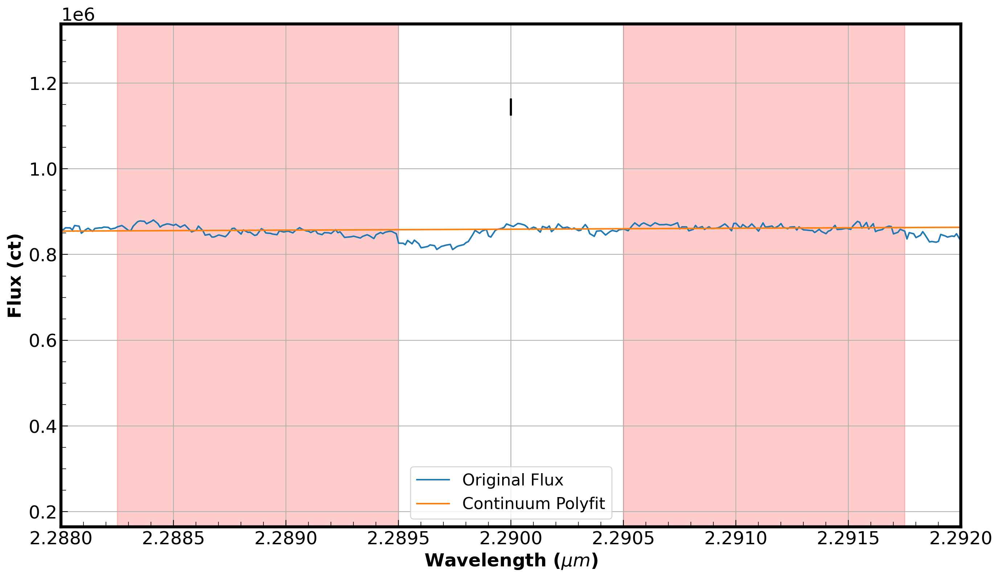

In [ ]:
fig,ax = plt.subplots(figsize=(16,9))

plt.plot(wavlen, flux, label='Original Flux')
plt.plot(wavlen, continuum,label='Continuum Polyfit')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')


plt.axvspan(contlo_1,contlo_2, color='red', alpha=0.2)
plt.axvspan(conthi_1,conthi_2, color='red', alpha=0.2)


# text_y = 0.64e5
# ax.text(nir_dict['Ti-2.2218'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Fe-2.226'],text_y,'Fe',ha='center')
# ax.text(nir_dict['Ti-2.228'],text_y,'Ti',ha='center')
# ax.text(nir_dict['Ti-2.232'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
# plt.ylim(.2e5,.7e5)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 

ax.grid()
plt.legend()
plt.show()

# Gaussian Fitting

$f(x) = \frac{A}{\sigma \sqrt{2\pi}} \exp(-\frac{1}{2}( \frac{x-\mu}{\sigma})^2)$

In [ ]:
# Use Normalized Gaussian Distribution
def gaussian_func(x,ampl,center,std,b):
    return ((ampl)/(std*np.sqrt(2*np.pi)) * np.exp(-0.5*(x - center)**2 / (std**2))) + b

# Find the indices for the min and max wavelengths of the spectral feature 
linemin_idx = (wavlen-wave_lim1).abs().idxmin()
linemax_idx = (wavlen-wave_lim2).abs().idxmin()

wavemin = wavlen[linemin_idx]
wavemax = wavlen[linemax_idx]

# initial guesses, need 4 inputs: Amplitude, center, std_dev, b (y offset)
init_params = -1.,  wave_center, .01, wavlen.loc[wavemin_idx:wavemax_idx].min()
# Bounds on the parameters
bounds = ([-10.,0.,0.01,0.95],[10,200.,100.,1.05])

popt, pcov = curve_fit(f=gaussian_func, xdata=wavlen.loc[contlo_min:conthi_max], ydata=cont_norm.loc[contlo_min:conthi_max],p0=init_params, maxfev=10000)

# Gaussian Fit to spectral feature using the best fit parameters
best_model = gaussian_func(wavlen, *popt)

print("Best Fit Parameters:", popt)

Best Fit Parameters: [-1.78525476e-05  2.28965293e+00  1.43776844e-04  1.00118667e+00]


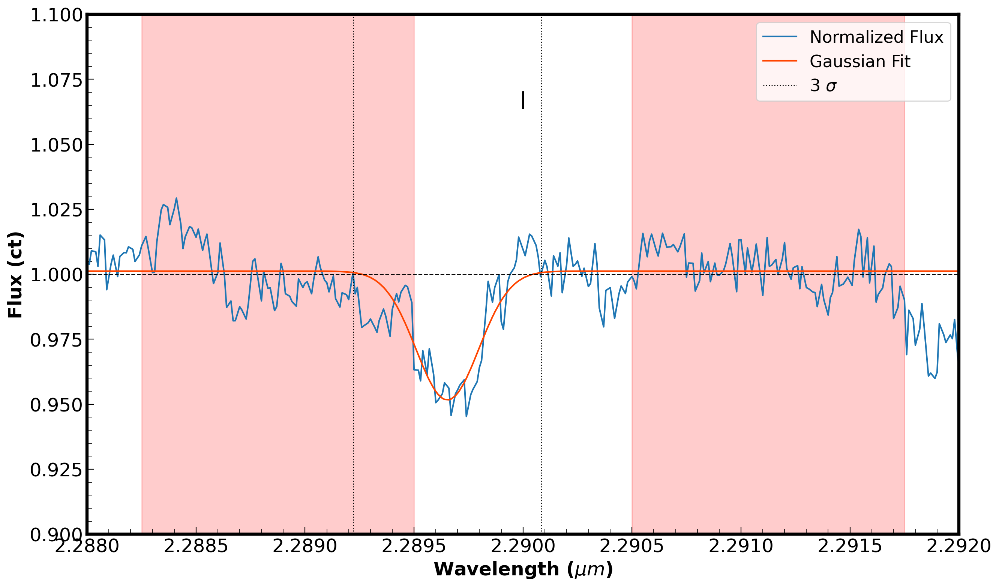

In [ ]:
fig,ax = plt.subplots(figsize=(15,9))

plt.plot(wavlen, cont_norm,label='Normalized Flux')
plt.plot(wavlen, best_model,color='orangered', label='Gaussian Fit')

# plt.fill_between(wavlen, y1=best_model, y2=1.0, where=(wavlen >= wavlen[contlo_max]) & (wavlen <= wavlen[conthi_min]), color='gray', alpha=0.5, label='Line Region')

plt.axhline(y=1, color='black', linewidth=1, linestyle='dashed')
plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')
# plt.axhline(y=half_max,color='black',lw=1,ls='dashed')
# plt.axvline(x=popt[1]+3*popt[2], color='black', linewidth=1, linestyle='dotted',label='3 $\sigma$')
# plt.axvline(x=popt[1]-3*popt[2], color='black', linewidth=1, linestyle='dotted')

# Loop through NIR line dictionary and plot vertical, dashed lines at those wavelengths
# Iterate over number of objects
for i in range(len(nir_dict)):
    # Iterate over the NIR dictionary
    for ii in range(len(lines_wav)):
        plt.axvline(lines_wav[ii],0.82,0.85,color='black')
    # ax.text(lines_wav[ii],text_y,labels,ha='center')

# Continuum Estimation region
plt.axvspan(wavlen[contlo_min],wavlen[contlo_max], color='red', alpha=0.2)
plt.axvspan(wavlen[conthi_min],wavlen[conthi_max], color='red', alpha=0.2)

# text_y = 1.06
# ax.text(nir_dict['Ti-2.224'],text_y,'Ti',ha='center')

# Set fig axis limits
plt.xlim(wave_center-0.002,wave_center+0.002)
plt.ylim(0.9,1.1)

# Enable minor tick marks
ax.minorticks_on()

plt.xlabel('Wavelength ({})'.format('$\mu m$')) 
plt.ylabel('Flux ({})'.format("ct")) 
plt.legend()

# plt.savefig(fig_path+'anon1_Ti_2_224_gauss.png')
plt.show()

# Equivalent Width

A few different ways

In [ ]:
# Flux at that central wavelength pixel
center_flux = best_model[center_idx]
print("Flux at Central Wavelength:", center_flux)

center_abs = 1-center_flux
print("Relative Absorption:", center_abs)


# Get FWHM
half_flux = 1-(center_abs/2)
print("Half Max Flux:", half_flux)

half_abs = center_abs/2
print("Half Relative Absorption:", half_abs)

# Need wavelengths where flux is at FWHM
# (best_model-half_max).abs().idxmin()


Flux at Central Wavelength: 0.998497709957744
Relative Absorption: 0.0015022900422559937
Half Max Flux: 0.9992488549788721
Half Relative Absorption: 0.0007511450211279969


In [ ]:
# The quick way to calculate the area
sigma = popt[2]
a = 1-cont_norm[center_idx]
(a * sigma * np.sqrt(2*np.pi))/(cont_norm[center_idx])

-3.401327234142033e-06

In [ ]:
# Using the continuum-normalized flux
resid_flux1 = 1 - (cont_norm)
# Integrating over wavelength range where I defined the spectral feature
ew1 = trapz(resid_flux1.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew1:.6f}?")

Equivalent Width for Ti-2.224: 0.000014?


In [ ]:
# Using the Gaussian fit
resid_flux2 = 1 - (best_model)
# Integrating over wavelength range where I defined the spectral feature
ew2 = trapz(resid_flux2.loc[linemin_idx:linemax_idx], wavlen.loc[linemin_idx:linemax_idx])

print(f"Equivalent Width for Ti-2.224: {ew2:.6f}")

Equivalent Width for Ti-2.224: 0.000014
